<a href="https://colab.research.google.com/github/kartikgill/The-GAN-Book/blob/main/Skill-07/W-GAN-GP-TF1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Useful Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

# Installing TF-1.14

In [ ]:
pip install tensorflow==1.14

In [ ]:
pip install keras==2.3.0

In [2]:
import tensorflow as tf
import keras
print (tf.__version__)

1.14.0


Using TensorFlow backend.


In [3]:
print (keras.__version__)

2.3.0


# Download and show Dataset

Training data shapes: X=(60000, 28, 28), y=(60000,)
Testing data shapes: X=(10000, 28, 28), y=(10000,)


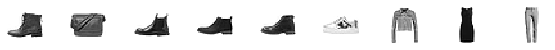

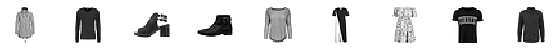

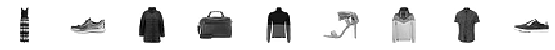

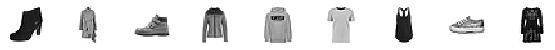

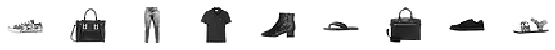

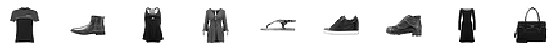

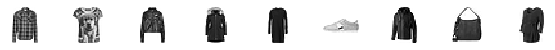

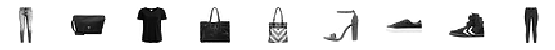

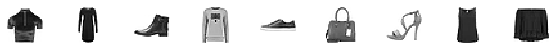

In [5]:
from tensorflow.keras.datasets import fashion_mnist, mnist

(trainX, trainY), (testX, testY) = fashion_mnist.load_data()

print('Training data shapes: X=%s, y=%s' % (trainX.shape, trainY.shape))
print('Testing data shapes: X=%s, y=%s' % (testX.shape, testY.shape))


for k in range(9):
    plt.figure(figsize=(10, 7))
    for j in range(9):
        i = np.random.randint(0, 10000)
        plt.subplot(990 + 1 + j)
        plt.imshow(trainX[i], cmap='gray_r')
        #plt.title(trainY[i])
        plt.axis('off')
    plt.show()

In [6]:
#Ten classes
set(trainY)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

# Data Normalization

In [7]:
trainX = [(image-127.5)/127.5 for image in trainX]
testX = [(image-127.5)/127.5 for image in testX]

trainX = np.reshape(trainX, (60000, 28, 28, 1))
testX = np.reshape(testX, (10000, 28, 28, 1))

print (trainX.shape, testX.shape, trainY.shape, testY.shape)

(60000, 28, 28, 1) (10000, 28, 28, 1) (60000,) (10000,)


# Define Generator Model

In [8]:
def make_generator(random_input): 
    x = keras.layers.Dense(7*7*128)(random_input)
    x = keras.layers.Reshape((7, 7, 128))(x)

    x = keras.layers.Conv2DTranspose(filters=128, kernel_size=(4,4), strides=2, padding='same')(x)
    x = keras.layers.BatchNormalization(momentum=0.8)(x)
    x = keras.layers.Activation('relu')(x)

    x = keras.layers.Conv2DTranspose(filters=64, kernel_size=(4,4), strides=2, padding='same')(x)
    x = keras.layers.BatchNormalization(momentum=0.8)(x)
    x = keras.layers.Activation('relu')(x)

    x = keras.layers.Conv2DTranspose(filters=1, kernel_size=(4,4), padding='same')(x)
    generated_image = keras.layers.Activation('tanh')(x)

    generator_network = keras.models.Model(inputs=random_input, outputs=generated_image)
    print (generator_network.summary())
    return generator_network

# Define Critic

In [9]:
def make_critic(): 
    image_input = keras.layers.Input(shape=(28, 28, 1))

    x = keras.layers.Conv2D(filters=16, kernel_size=(3,3), strides=2, padding='same')(image_input)
    x = keras.layers.LeakyReLU(alpha=0.2)(x)
    x = keras.layers.Dropout(0.25)(x)

    x = keras.layers.Conv2D(filters=32, kernel_size=(3,3), strides=2, padding='same')(x)
    x = keras.layers.BatchNormalization(momentum=0.8)(x)
    x = keras.layers.LeakyReLU(alpha=0.2)(x)
    x = keras.layers.Dropout(0.25)(x)

    x = keras.layers.Conv2D(filters=64, kernel_size=(3,3), strides=2, padding='same')(x)
    x = keras.layers.BatchNormalization(momentum=0.8)(x)
    x = keras.layers.LeakyReLU(alpha=0.2)(x)
    x = keras.layers.Dropout(0.25)(x)

    x = keras.layers.Conv2D(filters=128, kernel_size=(3,3), padding='same')(x)
    x = keras.layers.BatchNormalization(momentum=0.8)(x)
    x = keras.layers.LeakyReLU(alpha=0.2)(x)
    x = keras.layers.Dropout(0.25)(x)

    x = keras.layers.Flatten()(x)

    c_out = keras.layers.Dense(1)(x)

    critic_network = keras.models.Model(inputs=image_input, outputs=c_out)

    print (critic_network.summary())
    return critic_network

# Define Wasserstein Loss

In [10]:
# custom loss function
def wasserstein_loss(y_true, y_pred):
    return keras.backend.mean(y_true * y_pred)

# Define Gradient Penalty Loss

In [11]:
# This cell code is taken from: https://github.com/eriklindernoren/Keras-GAN/blob/master/wgan_gp/wgan_gp.py
import keras
from functools import partial
import keras.backend as K
from keras.layers.merge import _Merge

class RandomWeightedAverage(_Merge):
    """Provides a (random) weighted average between real and generated image samples"""
    def _merge_function(self, inputs):
        alpha = K.random_uniform((32, 1, 1, 1))
        return (alpha * inputs[0]) + ((1 - alpha) * inputs[1])

def gradient_penalty_loss(y_true, y_pred, averaged_samples):
    """
    Computes gradient penalty based on prediction and weighted real / fake samples
    """
    gradients = K.gradients(y_pred, averaged_samples)[0]
    # compute the euclidean norm by squaring ...
    gradients_sqr = K.square(gradients)
    #   ... summing over the rows ...
    gradients_sqr_sum = K.sum(gradients_sqr,
                              axis=np.arange(1, len(gradients_sqr.shape)))
    #   ... and sqrt
    gradient_l2_norm = K.sqrt(gradients_sqr_sum)
    # compute lambda * (1 - ||grad||)^2 still for each single sample
    gradient_penalty = K.square(1 - gradient_l2_norm)
    # return the mean as loss over all the batch samples
    return K.mean(gradient_penalty)

# Define Final Critic and WGAN-GP Model

In [12]:
def make_critic_model():
    real_img = keras.Input(shape=(28, 28, 1))
    random_input = keras.layers.Input(shape=(100,))
    
    generator_network = make_generator(random_input)
    critic_network = make_critic()
    
    generator_network.trainable=False
    critic_network.trainable=True
    
    fake_img = generator_network(random_input)

    interpolated_img = RandomWeightedAverage()([real_img, fake_img])
    c_out_interpolated = critic_network(interpolated_img)

    partial_gp_loss = partial(gradient_penalty_loss,
                              averaged_samples=interpolated_img)
    partial_gp_loss.__name__ = 'gradient_penalty' # Keras requires function names

    fake = critic_network(fake_img)
    real = critic_network(real_img)

    critic_model = keras.models.Model(inputs=[real_img, random_input], outputs=[real, fake, c_out_interpolated])
    
    # compiling model
    optimizer = keras.optimizers.RMSprop(lr=0.00005)

    critic_model.compile(loss=[wasserstein_loss, wasserstein_loss, partial_gp_loss], \
                         optimizer=optimizer, metrics=['accuracy'], loss_weights=[1,1,10])
    
    print (critic_model.summary())
    return critic_model, critic_network, generator_network

def make_wgan_gp(critic_network, generator_network):

    #Defining Combined Model
    critic_network.trainable=False
    generator_network.trainable=True

    noise_input = keras.layers.Input(shape=(100,))
    
    g_output = generator_network(noise_input)
    c_output = critic_network(g_output)

    wgan_gp_model = keras.models.Model(inputs = noise_input, outputs = c_output)
    
    # compiling model
    optimizer = keras.optimizers.RMSprop(lr=0.00005)

    wgan_gp_model.compile(loss=wasserstein_loss, optimizer=optimizer)
    
    print (wgan_gp_model.summary())
    
    return wgan_gp_model

In [13]:
critic_model, critic_network, generator_network = make_critic_model()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6272)              633472    
_________________________________________________________________
reshape_1 (Reshape)          (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 14, 14, 128)       262272    
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 128)       512       
_________________________________________________________________
activation_1 (Activation)    (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 28, 28, 64)        1311

In [14]:
wgan_gp_model = make_wgan_gp(critic_network, generator_network)

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 100)               0         
_________________________________________________________________
model_1 (Model)              (None, 28, 28, 1)         1028673   
_________________________________________________________________
model_2 (Model)              (None, 1)                 100097    
Total params: 1,128,770
Trainable params: 1,028,289
Non-trainable params: 100,481
_________________________________________________________________
None


# Define Data Generators

In [15]:
indices = [i for i in range(0, len(trainX))]

def get_random_noise(batch_size, noise_size):
    random_noise_batches = np.random.normal(0, 1, (batch_size, noise_size))
    return random_noise_batches

def get_fake_samples(generator_network, batch_size, noise_size):
    random_noise_batches = get_random_noise(batch_size, noise_size) 
    fake_samples = generator_network.predict_on_batch(random_noise_batches)
    return fake_samples

def get_real_samples(batch_size):
    random_indices = np.random.choice(indices, size=batch_size)
    real_images = trainX[np.array(random_indices),:]
    return real_images

def show_generator_results(generator_network):
    for k in range(9):
        plt.figure(figsize=(9, 6))
        random_noise_batches = get_random_noise(10, noise_size) 
        fake_samples = generator_network.predict_on_batch(random_noise_batches)
        for j in range(9):
            i = j
            plt.subplot(990 + 1 + j)
            plt.imshow(fake_samples[i,:,:,-1], cmap='gray_r')
            plt.axis('off')
        plt.show()
    return

# Training W-GAN-GP

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


/Users/k15/anaconda/envs/torch/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/Users/k15/anaconda/envs/torch/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:0, Step:0, C-Loss:15.124 G-Loss:-0.189


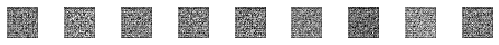

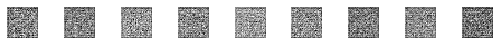

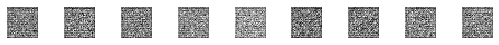

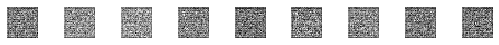

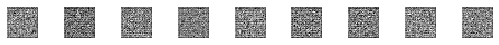

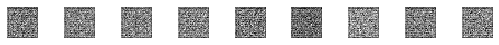

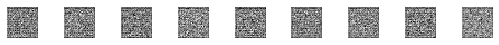

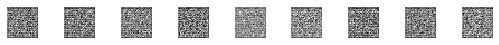

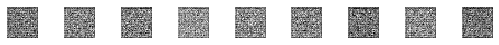

/Users/k15/anaconda/envs/torch/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:0, Step:10, C-Loss:1.847 G-Loss:0.010
Epoch:0, Step:20, C-Loss:-0.361 G-Loss:-0.065
Epoch:0, Step:30, C-Loss:-1.830 G-Loss:-0.226
Epoch:0, Step:40, C-Loss:-2.138 G-Loss:-0.436
Epoch:0, Step:50, C-Loss:-1.353 G-Loss:-0.262
Epoch:0, Step:60, C-Loss:-2.981 G-Loss:-0.225
Epoch:0, Step:70, C-Loss:-2.414 G-Loss:0.341
Epoch:0, Step:80, C-Loss:-2.423 G-Loss:0.593
Epoch:0, Step:90, C-Loss:-2.528 G-Loss:0.973
Epoch:0, Step:100, C-Loss:-2.562 G-Loss:1.088


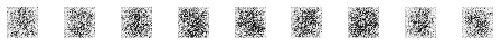

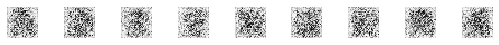

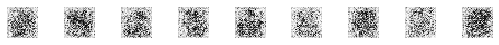

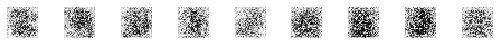

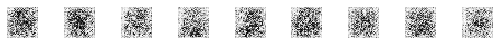

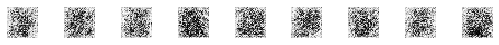

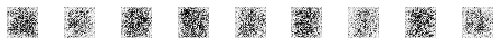

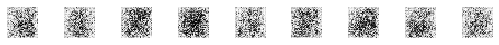

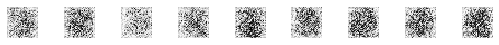

Epoch:0, Step:110, C-Loss:-1.978 G-Loss:1.095
Epoch:0, Step:120, C-Loss:-2.034 G-Loss:1.386
Epoch:0, Step:130, C-Loss:-1.566 G-Loss:1.093
Epoch:0, Step:140, C-Loss:-1.637 G-Loss:0.666
Epoch:0, Step:150, C-Loss:-1.479 G-Loss:0.137
Epoch:0, Step:160, C-Loss:-1.498 G-Loss:-0.332
Epoch:0, Step:170, C-Loss:-1.961 G-Loss:-0.487
Epoch:0, Step:180, C-Loss:-1.998 G-Loss:-1.213
Epoch:0, Step:190, C-Loss:-1.253 G-Loss:-1.467
Epoch:0, Step:200, C-Loss:-1.423 G-Loss:-0.836


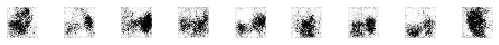

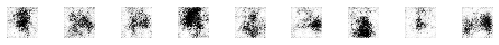

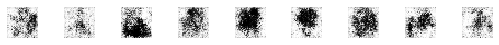

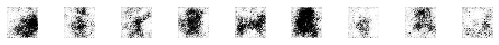

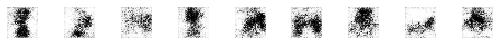

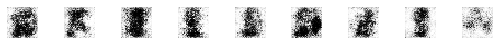

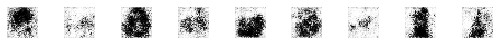

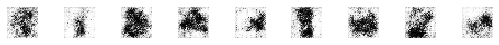

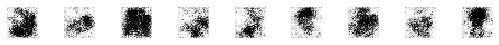

Epoch:0, Step:210, C-Loss:-0.843 G-Loss:-0.696
Epoch:0, Step:220, C-Loss:-1.258 G-Loss:-0.872
Epoch:0, Step:230, C-Loss:-2.157 G-Loss:-0.588
Epoch:0, Step:240, C-Loss:-1.023 G-Loss:0.428
Epoch:0, Step:250, C-Loss:-0.314 G-Loss:0.206
Epoch:0, Step:260, C-Loss:-1.064 G-Loss:0.383
Epoch:0, Step:270, C-Loss:-0.653 G-Loss:1.013
Epoch:0, Step:280, C-Loss:-1.208 G-Loss:0.849
Epoch:0, Step:290, C-Loss:-0.635 G-Loss:0.359
Epoch:0, Step:300, C-Loss:-0.562 G-Loss:0.249


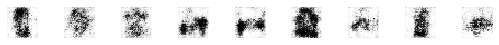

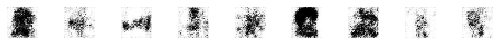

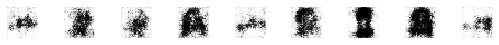

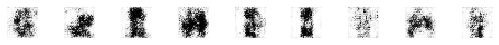

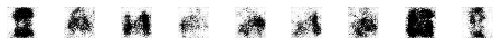

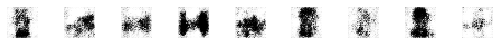

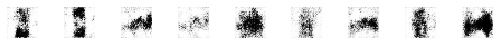

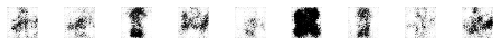

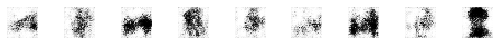

Epoch:0, Step:310, C-Loss:-1.250 G-Loss:0.447
Epoch:0, Step:320, C-Loss:-0.495 G-Loss:0.840
Epoch:0, Step:330, C-Loss:-0.933 G-Loss:0.756
Epoch:0, Step:340, C-Loss:-0.479 G-Loss:1.336
Epoch:0, Step:350, C-Loss:-1.338 G-Loss:1.045
Epoch:0, Step:360, C-Loss:-0.862 G-Loss:1.362
Epoch:0, Step:370, C-Loss:-0.750 G-Loss:1.513
Epoch:0, Step:380, C-Loss:-1.525 G-Loss:1.406
Epoch:0, Step:390, C-Loss:-1.011 G-Loss:1.598
Epoch:0, Step:400, C-Loss:-1.061 G-Loss:1.434


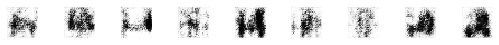

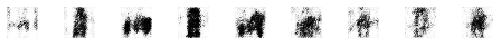

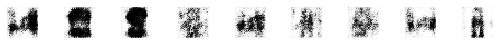

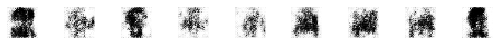

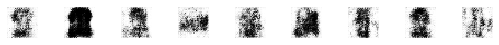

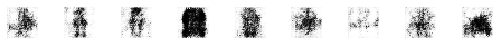

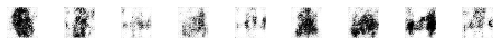

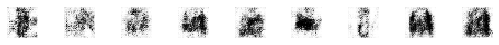

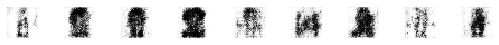

Epoch:0, Step:410, C-Loss:-0.845 G-Loss:1.308
Epoch:0, Step:420, C-Loss:-1.208 G-Loss:1.686
Epoch:0, Step:430, C-Loss:-1.322 G-Loss:1.586
Epoch:0, Step:440, C-Loss:-0.981 G-Loss:1.624
Epoch:0, Step:450, C-Loss:-0.819 G-Loss:1.452
Epoch:0, Step:460, C-Loss:-1.030 G-Loss:1.761
Epoch:0, Step:470, C-Loss:-0.762 G-Loss:2.058
Epoch:0, Step:480, C-Loss:-1.244 G-Loss:1.937
Epoch:0, Step:490, C-Loss:-1.898 G-Loss:1.380
Epoch:1, Step:0, C-Loss:-1.312 G-Loss:1.551


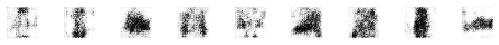

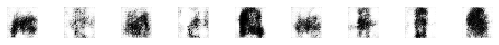

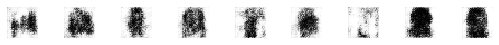

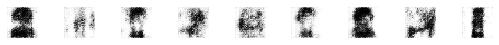

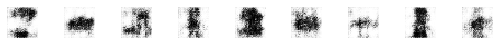

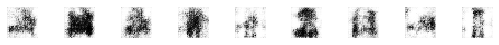

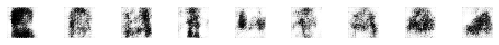

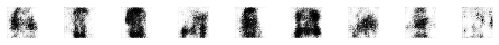

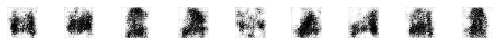

Epoch:1, Step:10, C-Loss:-1.545 G-Loss:1.909
Epoch:1, Step:20, C-Loss:-1.275 G-Loss:1.860
Epoch:1, Step:30, C-Loss:-1.761 G-Loss:2.128
Epoch:1, Step:40, C-Loss:-1.469 G-Loss:1.735
Epoch:1, Step:50, C-Loss:-1.785 G-Loss:1.257
Epoch:1, Step:60, C-Loss:-1.187 G-Loss:1.830
Epoch:1, Step:70, C-Loss:-1.257 G-Loss:1.564
Epoch:1, Step:80, C-Loss:-0.820 G-Loss:1.648
Epoch:1, Step:90, C-Loss:-1.383 G-Loss:1.679
Epoch:1, Step:100, C-Loss:-1.372 G-Loss:1.941


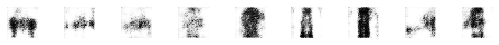

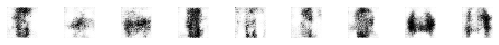

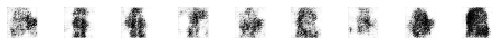

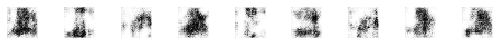

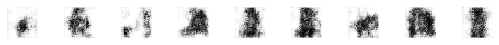

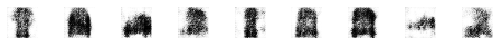

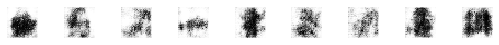

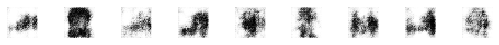

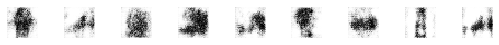

Epoch:1, Step:110, C-Loss:-1.237 G-Loss:1.685
Epoch:1, Step:120, C-Loss:-1.084 G-Loss:1.977
Epoch:1, Step:130, C-Loss:-1.780 G-Loss:1.846
Epoch:1, Step:140, C-Loss:-1.422 G-Loss:2.109
Epoch:1, Step:150, C-Loss:-1.546 G-Loss:2.160
Epoch:1, Step:160, C-Loss:-1.920 G-Loss:2.027
Epoch:1, Step:170, C-Loss:-1.856 G-Loss:2.270
Epoch:1, Step:180, C-Loss:-2.086 G-Loss:1.649
Epoch:1, Step:190, C-Loss:-1.501 G-Loss:2.078
Epoch:1, Step:200, C-Loss:-0.897 G-Loss:1.791


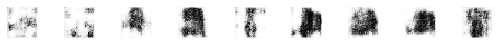

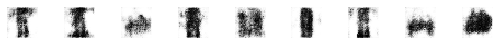

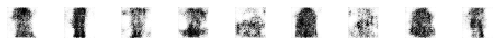

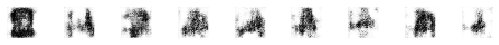

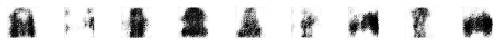

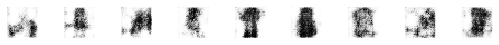

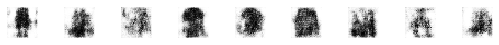

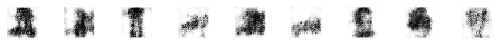

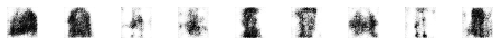

Epoch:1, Step:210, C-Loss:-1.874 G-Loss:1.734
Epoch:1, Step:220, C-Loss:-1.182 G-Loss:1.801
Epoch:1, Step:230, C-Loss:-1.425 G-Loss:2.115
Epoch:1, Step:240, C-Loss:-2.078 G-Loss:1.963
Epoch:1, Step:250, C-Loss:-0.952 G-Loss:1.756
Epoch:1, Step:260, C-Loss:-1.688 G-Loss:1.672
Epoch:1, Step:270, C-Loss:-1.072 G-Loss:2.368
Epoch:1, Step:280, C-Loss:-1.493 G-Loss:2.098
Epoch:1, Step:290, C-Loss:-1.599 G-Loss:1.984
Epoch:1, Step:300, C-Loss:-1.815 G-Loss:1.406


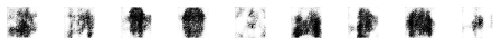

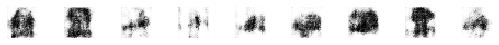

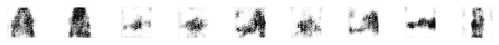

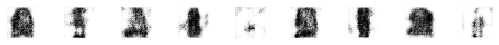

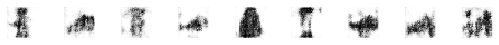

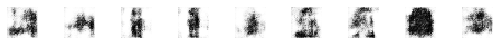

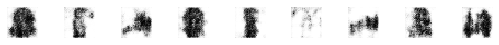

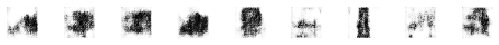

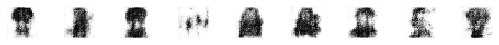

Epoch:1, Step:310, C-Loss:-2.549 G-Loss:2.340
Epoch:1, Step:320, C-Loss:-2.465 G-Loss:2.063
Epoch:1, Step:330, C-Loss:-1.928 G-Loss:1.893
Epoch:1, Step:340, C-Loss:-1.488 G-Loss:1.856
Epoch:1, Step:350, C-Loss:-2.167 G-Loss:1.863
Epoch:1, Step:360, C-Loss:-2.667 G-Loss:2.837
Epoch:1, Step:370, C-Loss:-1.672 G-Loss:2.358
Epoch:1, Step:380, C-Loss:-2.387 G-Loss:2.343
Epoch:1, Step:390, C-Loss:-1.345 G-Loss:1.786
Epoch:1, Step:400, C-Loss:-2.410 G-Loss:2.239


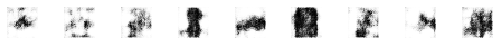

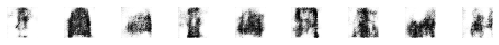

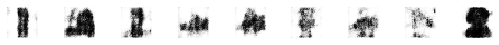

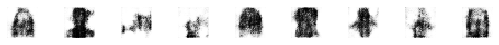

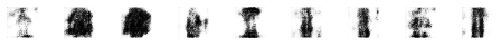

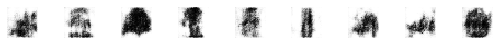

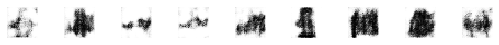

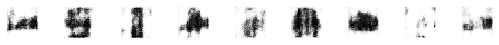

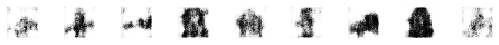

Epoch:1, Step:410, C-Loss:-2.467 G-Loss:1.669
Epoch:1, Step:420, C-Loss:-2.397 G-Loss:2.006
Epoch:1, Step:430, C-Loss:-1.948 G-Loss:2.336
Epoch:1, Step:440, C-Loss:-1.827 G-Loss:2.166
Epoch:1, Step:450, C-Loss:-1.999 G-Loss:2.119
Epoch:1, Step:460, C-Loss:-1.603 G-Loss:2.235
Epoch:1, Step:470, C-Loss:-1.625 G-Loss:1.742
Epoch:1, Step:480, C-Loss:-1.205 G-Loss:1.953
Epoch:1, Step:490, C-Loss:-1.943 G-Loss:1.302
Epoch:2, Step:0, C-Loss:-1.493 G-Loss:1.175


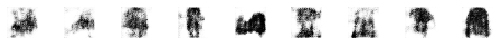

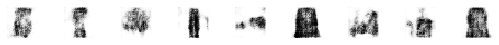

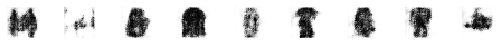

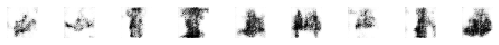

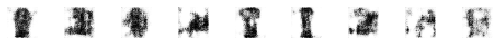

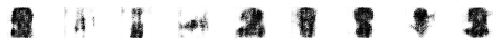

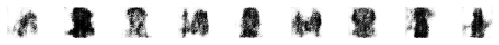

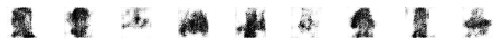

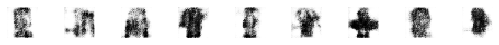

Epoch:2, Step:10, C-Loss:-1.897 G-Loss:2.115
Epoch:2, Step:20, C-Loss:-1.820 G-Loss:2.814
Epoch:2, Step:30, C-Loss:-1.946 G-Loss:2.185
Epoch:2, Step:40, C-Loss:-1.414 G-Loss:1.723
Epoch:2, Step:50, C-Loss:-1.382 G-Loss:1.324
Epoch:2, Step:60, C-Loss:-1.614 G-Loss:1.578
Epoch:2, Step:70, C-Loss:-2.078 G-Loss:1.045
Epoch:2, Step:80, C-Loss:-2.087 G-Loss:0.878
Epoch:2, Step:90, C-Loss:-2.019 G-Loss:1.613
Epoch:2, Step:100, C-Loss:-1.719 G-Loss:0.916


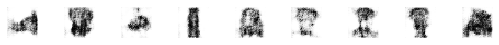

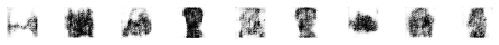

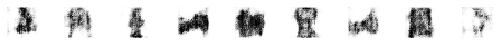

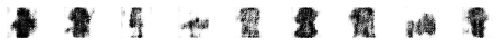

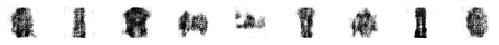

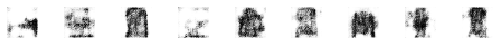

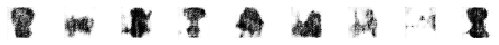

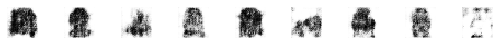

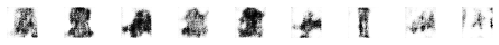

Epoch:2, Step:110, C-Loss:-2.072 G-Loss:1.363
Epoch:2, Step:120, C-Loss:-1.052 G-Loss:1.354
Epoch:2, Step:130, C-Loss:-1.508 G-Loss:2.107
Epoch:2, Step:140, C-Loss:-1.602 G-Loss:1.865
Epoch:2, Step:150, C-Loss:-2.037 G-Loss:1.761
Epoch:2, Step:160, C-Loss:-1.401 G-Loss:1.367
Epoch:2, Step:170, C-Loss:-0.867 G-Loss:0.911
Epoch:2, Step:180, C-Loss:-1.375 G-Loss:1.270
Epoch:2, Step:190, C-Loss:-1.696 G-Loss:1.122
Epoch:2, Step:200, C-Loss:-1.657 G-Loss:1.530


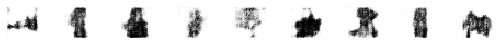

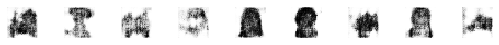

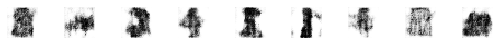

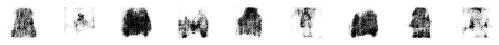

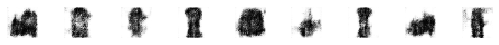

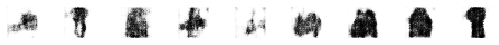

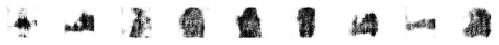

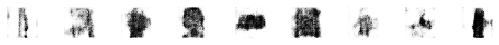

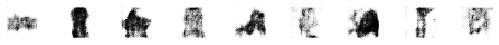

Epoch:2, Step:210, C-Loss:-1.527 G-Loss:1.261
Epoch:2, Step:220, C-Loss:-1.854 G-Loss:1.183
Epoch:2, Step:230, C-Loss:-1.460 G-Loss:1.360
Epoch:2, Step:240, C-Loss:-2.435 G-Loss:1.918
Epoch:2, Step:250, C-Loss:-1.174 G-Loss:2.197
Epoch:2, Step:260, C-Loss:-1.007 G-Loss:1.025
Epoch:2, Step:270, C-Loss:-1.721 G-Loss:1.313
Epoch:2, Step:280, C-Loss:-1.199 G-Loss:0.895
Epoch:2, Step:290, C-Loss:-2.341 G-Loss:1.332
Epoch:2, Step:300, C-Loss:-1.448 G-Loss:0.954


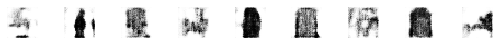

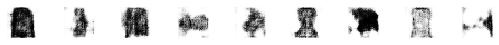

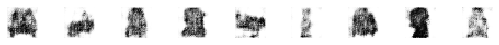

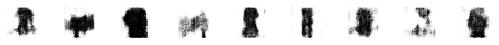

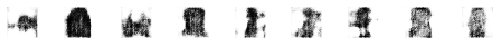

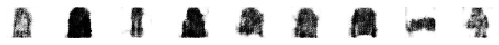

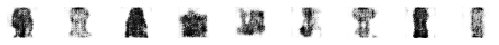

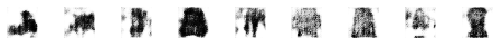

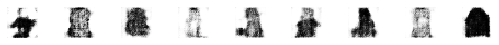

Epoch:2, Step:310, C-Loss:-1.117 G-Loss:0.971
Epoch:2, Step:320, C-Loss:-1.076 G-Loss:2.098
Epoch:2, Step:330, C-Loss:-0.704 G-Loss:0.981
Epoch:2, Step:340, C-Loss:-1.144 G-Loss:0.944
Epoch:2, Step:350, C-Loss:-1.183 G-Loss:1.561
Epoch:2, Step:360, C-Loss:-1.467 G-Loss:1.719
Epoch:2, Step:370, C-Loss:-1.681 G-Loss:1.808
Epoch:2, Step:380, C-Loss:-1.563 G-Loss:0.922
Epoch:2, Step:390, C-Loss:-2.251 G-Loss:1.260
Epoch:2, Step:400, C-Loss:-1.000 G-Loss:1.621


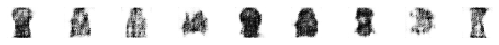

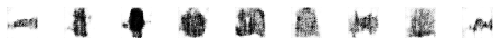

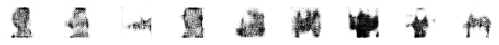

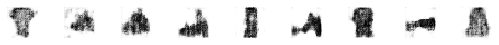

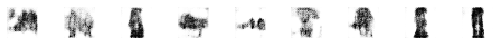

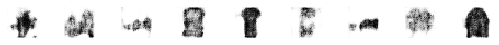

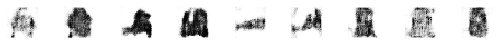

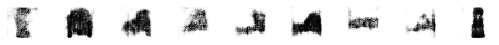

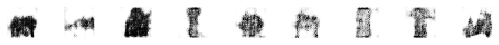

Epoch:2, Step:410, C-Loss:-1.507 G-Loss:1.434
Epoch:2, Step:420, C-Loss:-1.856 G-Loss:0.935
Epoch:2, Step:430, C-Loss:-1.159 G-Loss:1.452
Epoch:2, Step:440, C-Loss:-1.263 G-Loss:1.408
Epoch:2, Step:450, C-Loss:-0.949 G-Loss:1.650
Epoch:2, Step:460, C-Loss:-1.818 G-Loss:1.844
Epoch:2, Step:470, C-Loss:-0.674 G-Loss:1.869
Epoch:2, Step:480, C-Loss:-1.196 G-Loss:2.081
Epoch:2, Step:490, C-Loss:-2.113 G-Loss:2.043
Epoch:3, Step:0, C-Loss:-0.925 G-Loss:2.184


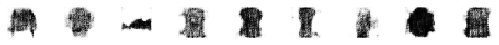

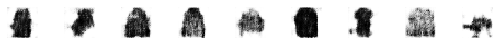

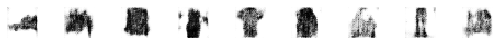

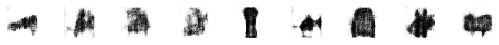

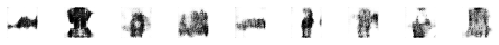

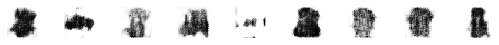

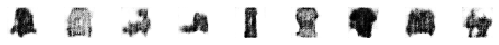

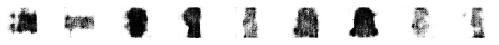

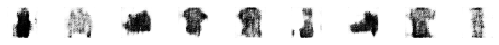

Epoch:3, Step:10, C-Loss:-1.811 G-Loss:1.447
Epoch:3, Step:20, C-Loss:-1.158 G-Loss:2.371
Epoch:3, Step:30, C-Loss:-1.585 G-Loss:1.812
Epoch:3, Step:40, C-Loss:-2.232 G-Loss:1.659
Epoch:3, Step:50, C-Loss:-1.484 G-Loss:1.651
Epoch:3, Step:60, C-Loss:-1.161 G-Loss:1.947
Epoch:3, Step:70, C-Loss:-1.582 G-Loss:1.448
Epoch:3, Step:80, C-Loss:-1.800 G-Loss:1.246
Epoch:3, Step:90, C-Loss:-0.433 G-Loss:1.494
Epoch:3, Step:100, C-Loss:-1.381 G-Loss:1.516


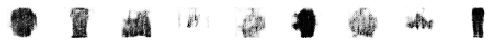

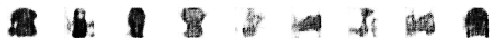

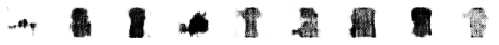

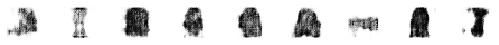

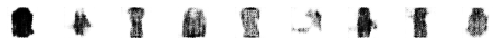

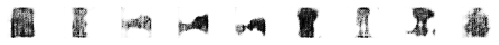

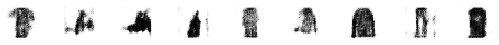

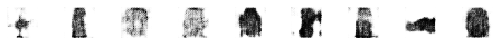

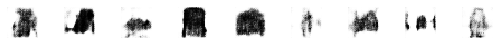

Epoch:3, Step:110, C-Loss:-0.691 G-Loss:2.266
Epoch:3, Step:120, C-Loss:-1.051 G-Loss:1.418
Epoch:3, Step:130, C-Loss:-2.101 G-Loss:1.354
Epoch:3, Step:140, C-Loss:-1.724 G-Loss:2.114
Epoch:3, Step:150, C-Loss:-1.546 G-Loss:2.270
Epoch:3, Step:160, C-Loss:-1.062 G-Loss:2.341
Epoch:3, Step:170, C-Loss:-1.419 G-Loss:1.876
Epoch:3, Step:180, C-Loss:-1.735 G-Loss:1.763
Epoch:3, Step:190, C-Loss:-1.647 G-Loss:2.601
Epoch:3, Step:200, C-Loss:-1.027 G-Loss:2.042


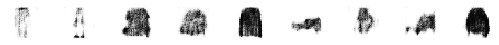

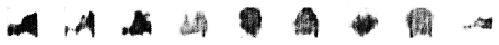

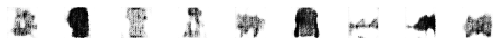

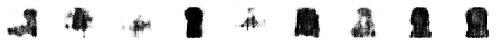

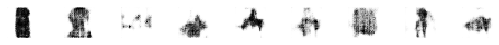

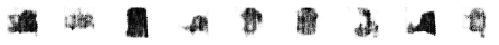

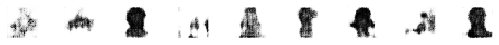

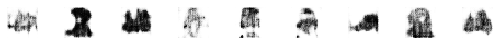

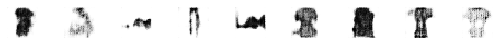

Epoch:3, Step:210, C-Loss:-0.941 G-Loss:1.719
Epoch:3, Step:220, C-Loss:-1.449 G-Loss:1.799
Epoch:3, Step:230, C-Loss:-1.842 G-Loss:1.676
Epoch:3, Step:240, C-Loss:-1.021 G-Loss:2.046
Epoch:3, Step:250, C-Loss:-0.958 G-Loss:2.116
Epoch:3, Step:260, C-Loss:-2.138 G-Loss:2.145
Epoch:3, Step:270, C-Loss:-1.498 G-Loss:2.540
Epoch:3, Step:280, C-Loss:-2.264 G-Loss:2.578
Epoch:3, Step:290, C-Loss:-1.628 G-Loss:2.165
Epoch:3, Step:300, C-Loss:-1.753 G-Loss:2.253


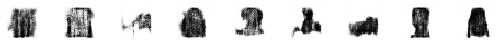

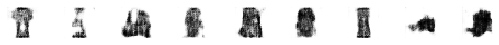

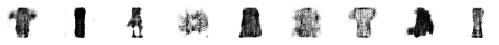

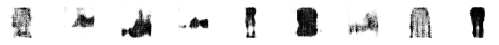

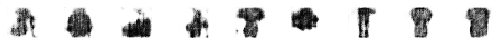

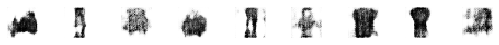

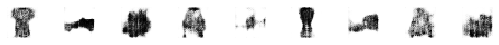

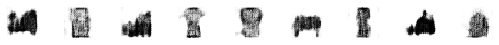

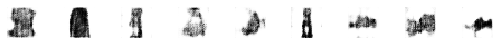

Epoch:3, Step:310, C-Loss:-0.454 G-Loss:2.281
Epoch:3, Step:320, C-Loss:-1.206 G-Loss:2.534
Epoch:3, Step:330, C-Loss:-1.920 G-Loss:2.940
Epoch:3, Step:340, C-Loss:-1.962 G-Loss:2.588
Epoch:3, Step:350, C-Loss:-1.793 G-Loss:2.933
Epoch:3, Step:360, C-Loss:-1.697 G-Loss:2.352
Epoch:3, Step:370, C-Loss:-1.163 G-Loss:2.548
Epoch:3, Step:380, C-Loss:-2.164 G-Loss:1.926
Epoch:3, Step:390, C-Loss:-1.157 G-Loss:2.173
Epoch:3, Step:400, C-Loss:-1.354 G-Loss:2.112


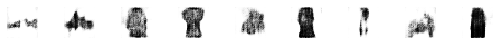

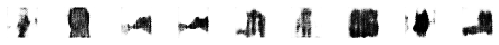

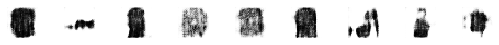

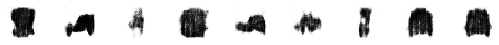

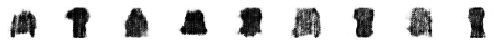

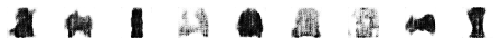

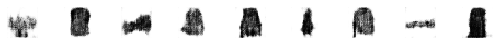

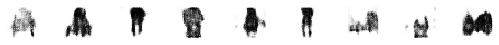

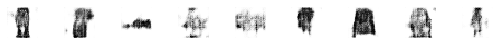

Epoch:3, Step:410, C-Loss:-0.622 G-Loss:2.154
Epoch:3, Step:420, C-Loss:-1.792 G-Loss:2.017
Epoch:3, Step:430, C-Loss:-1.588 G-Loss:1.961
Epoch:3, Step:440, C-Loss:-1.482 G-Loss:2.286
Epoch:3, Step:450, C-Loss:-1.741 G-Loss:2.201
Epoch:3, Step:460, C-Loss:-1.383 G-Loss:2.233
Epoch:3, Step:470, C-Loss:-1.693 G-Loss:2.017
Epoch:3, Step:480, C-Loss:-1.495 G-Loss:2.067
Epoch:3, Step:490, C-Loss:-1.584 G-Loss:2.115
Epoch:4, Step:0, C-Loss:-1.326 G-Loss:2.494


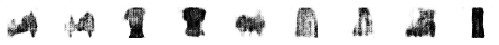

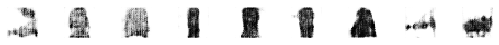

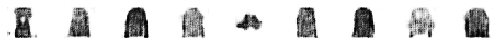

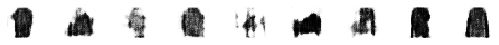

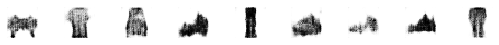

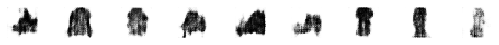

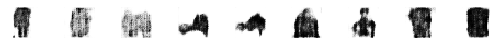

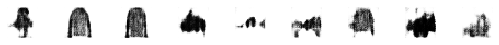

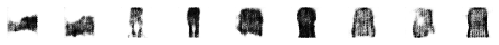

Epoch:4, Step:10, C-Loss:-0.823 G-Loss:2.470
Epoch:4, Step:20, C-Loss:-0.946 G-Loss:2.888
Epoch:4, Step:30, C-Loss:-1.279 G-Loss:2.203
Epoch:4, Step:40, C-Loss:-0.915 G-Loss:2.566
Epoch:4, Step:50, C-Loss:-1.632 G-Loss:2.739
Epoch:4, Step:60, C-Loss:-1.844 G-Loss:2.203
Epoch:4, Step:70, C-Loss:-0.825 G-Loss:2.422
Epoch:4, Step:80, C-Loss:-0.730 G-Loss:2.603
Epoch:4, Step:90, C-Loss:-1.937 G-Loss:1.895
Epoch:4, Step:100, C-Loss:-1.048 G-Loss:1.867


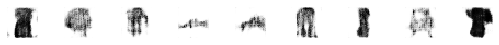

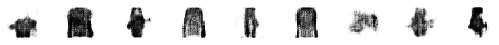

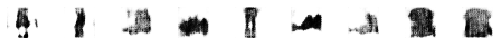

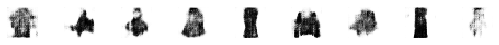

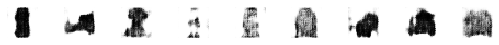

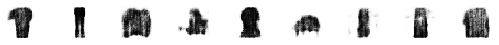

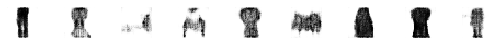

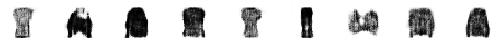

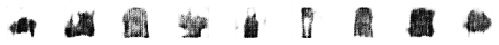

Epoch:4, Step:110, C-Loss:-1.351 G-Loss:2.440
Epoch:4, Step:120, C-Loss:-1.550 G-Loss:2.366
Epoch:4, Step:130, C-Loss:-1.101 G-Loss:2.302
Epoch:4, Step:140, C-Loss:-1.095 G-Loss:1.716
Epoch:4, Step:150, C-Loss:-0.977 G-Loss:2.301
Epoch:4, Step:160, C-Loss:-1.856 G-Loss:2.420
Epoch:4, Step:170, C-Loss:0.124 G-Loss:2.260
Epoch:4, Step:180, C-Loss:-1.356 G-Loss:2.017
Epoch:4, Step:190, C-Loss:-1.311 G-Loss:1.907
Epoch:4, Step:200, C-Loss:-1.508 G-Loss:1.719


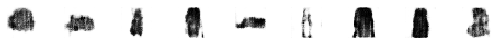

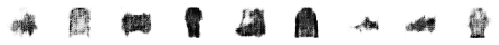

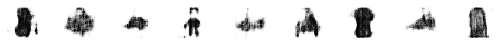

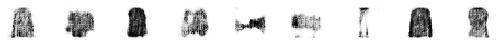

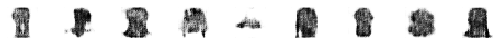

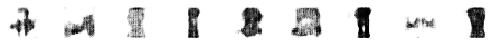

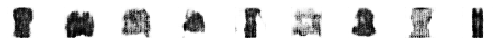

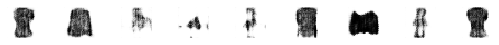

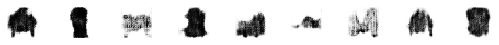

Epoch:4, Step:210, C-Loss:-1.305 G-Loss:2.387
Epoch:4, Step:220, C-Loss:-0.772 G-Loss:2.023
Epoch:4, Step:230, C-Loss:-1.516 G-Loss:3.016
Epoch:4, Step:240, C-Loss:-1.666 G-Loss:2.697
Epoch:4, Step:250, C-Loss:-1.835 G-Loss:2.080
Epoch:4, Step:260, C-Loss:-2.046 G-Loss:2.439
Epoch:4, Step:270, C-Loss:-1.129 G-Loss:2.343
Epoch:4, Step:280, C-Loss:-1.779 G-Loss:2.488
Epoch:4, Step:290, C-Loss:-1.822 G-Loss:1.912
Epoch:4, Step:300, C-Loss:-0.910 G-Loss:2.361


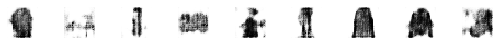

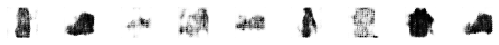

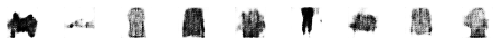

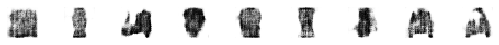

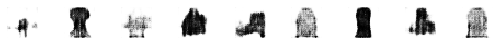

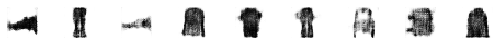

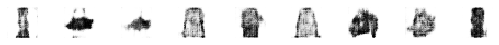

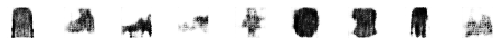

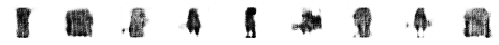

Epoch:4, Step:310, C-Loss:-1.677 G-Loss:2.759
Epoch:4, Step:320, C-Loss:-1.976 G-Loss:2.690
Epoch:4, Step:330, C-Loss:-1.832 G-Loss:2.166
Epoch:4, Step:340, C-Loss:-1.873 G-Loss:2.359
Epoch:4, Step:350, C-Loss:-1.699 G-Loss:2.102
Epoch:4, Step:360, C-Loss:-0.634 G-Loss:2.827
Epoch:4, Step:370, C-Loss:-1.162 G-Loss:2.324
Epoch:4, Step:380, C-Loss:-1.017 G-Loss:2.620
Epoch:4, Step:390, C-Loss:-1.193 G-Loss:2.359
Epoch:4, Step:400, C-Loss:-0.583 G-Loss:2.654


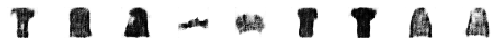

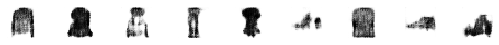

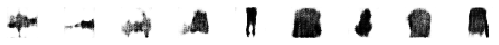

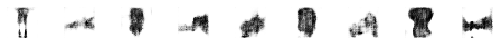

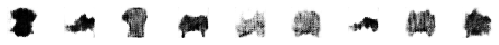

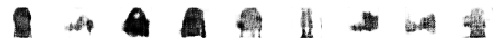

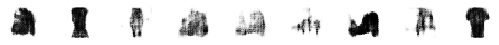

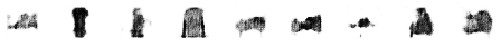

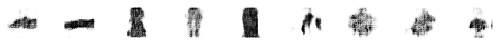

Epoch:4, Step:410, C-Loss:-1.008 G-Loss:2.406
Epoch:4, Step:420, C-Loss:-1.674 G-Loss:2.175
Epoch:4, Step:430, C-Loss:-1.330 G-Loss:3.207
Epoch:4, Step:440, C-Loss:-1.868 G-Loss:1.398
Epoch:4, Step:450, C-Loss:-1.673 G-Loss:2.943
Epoch:4, Step:460, C-Loss:-1.654 G-Loss:2.990
Epoch:4, Step:470, C-Loss:-1.767 G-Loss:2.496
Epoch:4, Step:480, C-Loss:-1.329 G-Loss:3.118
Epoch:4, Step:490, C-Loss:-0.450 G-Loss:2.169
Epoch:5, Step:0, C-Loss:-1.245 G-Loss:2.641


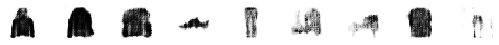

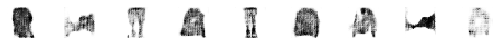

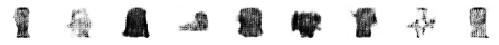

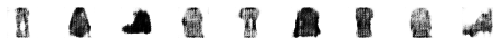

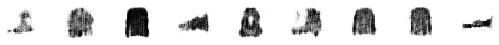

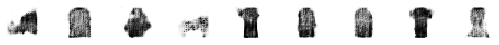

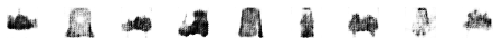

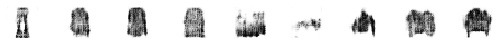

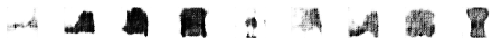

Epoch:5, Step:10, C-Loss:-1.045 G-Loss:2.756
Epoch:5, Step:20, C-Loss:-1.647 G-Loss:2.286
Epoch:5, Step:30, C-Loss:-1.766 G-Loss:1.736
Epoch:5, Step:40, C-Loss:-1.477 G-Loss:1.963
Epoch:5, Step:50, C-Loss:-1.351 G-Loss:1.809
Epoch:5, Step:60, C-Loss:-1.862 G-Loss:1.882
Epoch:5, Step:70, C-Loss:-1.184 G-Loss:2.122
Epoch:5, Step:80, C-Loss:-1.227 G-Loss:2.159
Epoch:5, Step:90, C-Loss:-0.412 G-Loss:1.522
Epoch:5, Step:100, C-Loss:-1.839 G-Loss:2.035


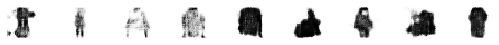

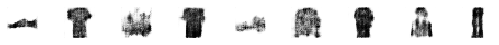

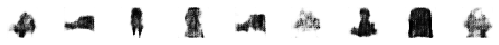

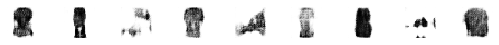

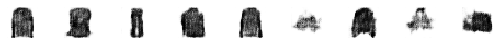

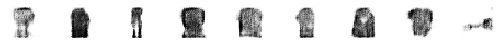

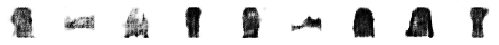

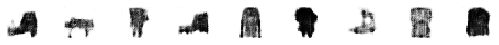

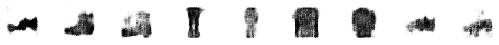

Epoch:5, Step:110, C-Loss:-0.683 G-Loss:2.189
Epoch:5, Step:120, C-Loss:-0.420 G-Loss:1.987
Epoch:5, Step:130, C-Loss:-1.739 G-Loss:2.137
Epoch:5, Step:140, C-Loss:-0.920 G-Loss:2.256
Epoch:5, Step:150, C-Loss:-0.760 G-Loss:2.379
Epoch:5, Step:160, C-Loss:-1.377 G-Loss:1.910
Epoch:5, Step:170, C-Loss:-1.268 G-Loss:2.319
Epoch:5, Step:180, C-Loss:-1.371 G-Loss:2.039
Epoch:5, Step:190, C-Loss:-1.471 G-Loss:2.253
Epoch:5, Step:200, C-Loss:-1.914 G-Loss:2.478


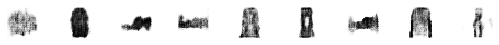

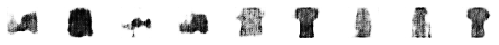

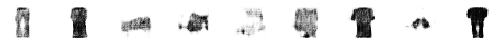

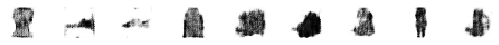

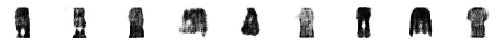

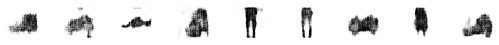

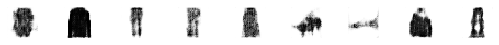

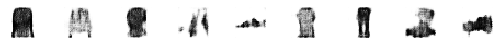

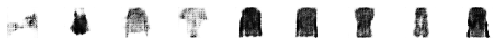

Epoch:5, Step:210, C-Loss:-1.328 G-Loss:2.370
Epoch:5, Step:220, C-Loss:-0.245 G-Loss:2.557
Epoch:5, Step:230, C-Loss:-1.520 G-Loss:2.192
Epoch:5, Step:240, C-Loss:-1.541 G-Loss:2.314
Epoch:5, Step:250, C-Loss:-0.699 G-Loss:2.615
Epoch:5, Step:260, C-Loss:-0.454 G-Loss:2.077
Epoch:5, Step:270, C-Loss:-1.443 G-Loss:2.213
Epoch:5, Step:280, C-Loss:-1.698 G-Loss:2.081
Epoch:5, Step:290, C-Loss:-1.279 G-Loss:1.714
Epoch:5, Step:300, C-Loss:-0.736 G-Loss:1.704


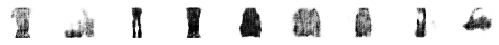

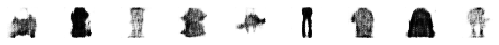

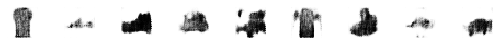

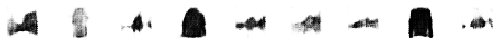

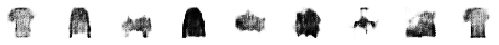

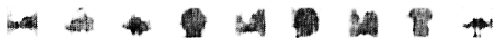

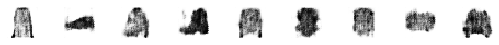

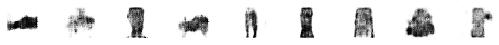

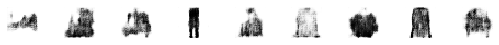

Epoch:5, Step:310, C-Loss:-1.489 G-Loss:1.961
Epoch:5, Step:320, C-Loss:-1.573 G-Loss:1.717
Epoch:5, Step:330, C-Loss:-2.253 G-Loss:1.929
Epoch:5, Step:340, C-Loss:-1.814 G-Loss:1.318
Epoch:5, Step:350, C-Loss:-0.536 G-Loss:1.949
Epoch:5, Step:360, C-Loss:-1.678 G-Loss:2.045
Epoch:5, Step:370, C-Loss:-1.606 G-Loss:1.951
Epoch:5, Step:380, C-Loss:-0.281 G-Loss:2.737
Epoch:5, Step:390, C-Loss:-0.885 G-Loss:2.163
Epoch:5, Step:400, C-Loss:-0.923 G-Loss:2.047


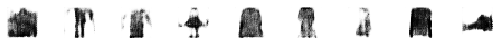

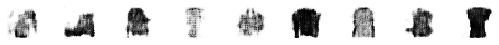

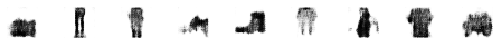

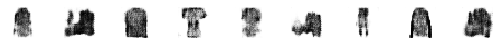

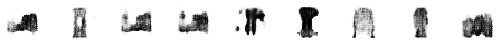

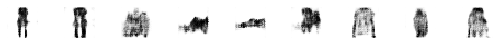

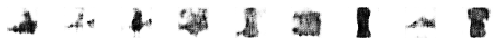

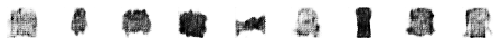

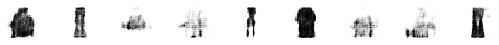

Epoch:5, Step:410, C-Loss:-1.644 G-Loss:1.252
Epoch:5, Step:420, C-Loss:-1.426 G-Loss:1.337
Epoch:5, Step:430, C-Loss:-0.756 G-Loss:2.315
Epoch:5, Step:440, C-Loss:-1.035 G-Loss:2.057
Epoch:5, Step:450, C-Loss:-0.616 G-Loss:1.954
Epoch:5, Step:460, C-Loss:-0.977 G-Loss:2.161
Epoch:5, Step:470, C-Loss:-0.698 G-Loss:1.730
Epoch:5, Step:480, C-Loss:-0.890 G-Loss:1.889
Epoch:5, Step:490, C-Loss:-0.900 G-Loss:2.188
Epoch:6, Step:0, C-Loss:-0.913 G-Loss:2.886


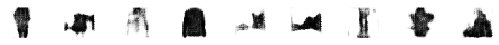

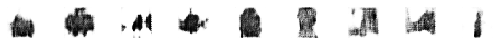

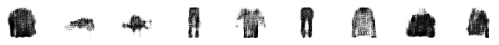

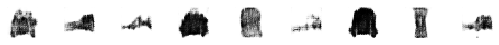

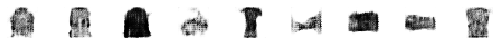

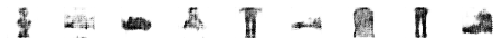

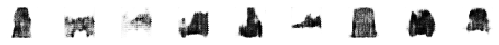

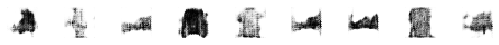

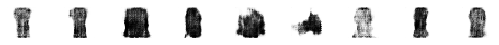

Epoch:6, Step:10, C-Loss:-0.933 G-Loss:2.299
Epoch:6, Step:20, C-Loss:-2.312 G-Loss:1.647
Epoch:6, Step:30, C-Loss:-1.629 G-Loss:2.420
Epoch:6, Step:40, C-Loss:-1.172 G-Loss:1.512
Epoch:6, Step:50, C-Loss:-1.669 G-Loss:2.060
Epoch:6, Step:60, C-Loss:-0.974 G-Loss:2.299
Epoch:6, Step:70, C-Loss:-1.264 G-Loss:2.287
Epoch:6, Step:80, C-Loss:-1.115 G-Loss:1.394
Epoch:6, Step:90, C-Loss:-1.860 G-Loss:2.205
Epoch:6, Step:100, C-Loss:-1.271 G-Loss:1.536


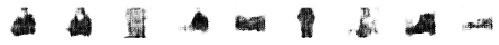

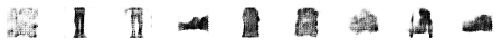

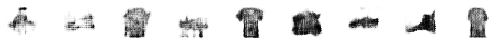

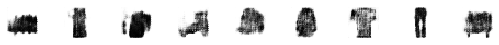

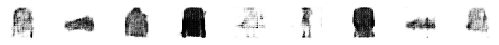

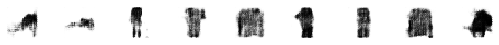

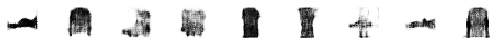

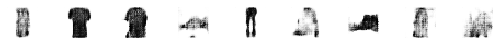

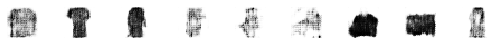

Epoch:6, Step:110, C-Loss:-1.244 G-Loss:1.620
Epoch:6, Step:120, C-Loss:-0.914 G-Loss:2.279
Epoch:6, Step:130, C-Loss:-0.833 G-Loss:1.584
Epoch:6, Step:140, C-Loss:-1.402 G-Loss:2.026
Epoch:6, Step:150, C-Loss:-1.583 G-Loss:1.997
Epoch:6, Step:160, C-Loss:-1.401 G-Loss:1.807
Epoch:6, Step:170, C-Loss:-1.262 G-Loss:1.911
Epoch:6, Step:180, C-Loss:-0.320 G-Loss:2.896
Epoch:6, Step:190, C-Loss:-0.911 G-Loss:1.273
Epoch:6, Step:200, C-Loss:-1.161 G-Loss:1.802


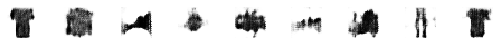

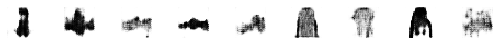

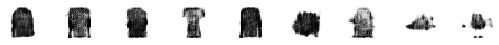

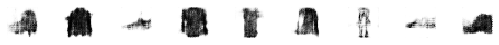

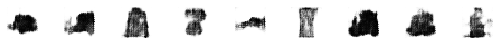

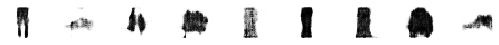

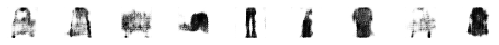

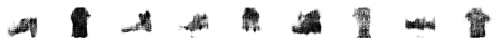

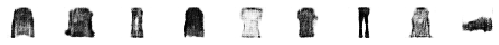

Epoch:6, Step:210, C-Loss:-1.570 G-Loss:1.352
Epoch:6, Step:220, C-Loss:-1.266 G-Loss:1.838
Epoch:6, Step:230, C-Loss:-1.624 G-Loss:2.149
Epoch:6, Step:240, C-Loss:-2.282 G-Loss:1.882
Epoch:6, Step:250, C-Loss:-0.808 G-Loss:2.054
Epoch:6, Step:260, C-Loss:-1.122 G-Loss:1.703
Epoch:6, Step:270, C-Loss:-0.920 G-Loss:1.863
Epoch:6, Step:280, C-Loss:-1.106 G-Loss:1.537
Epoch:6, Step:290, C-Loss:0.223 G-Loss:1.944
Epoch:6, Step:300, C-Loss:-1.276 G-Loss:2.170


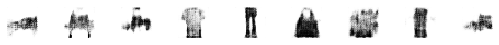

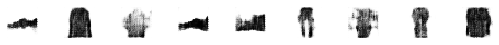

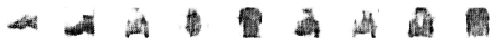

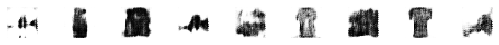

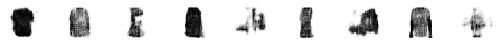

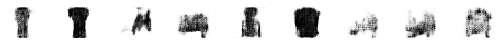

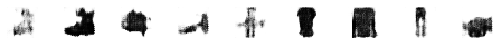

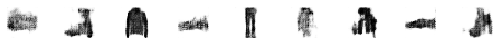

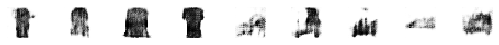

Epoch:6, Step:310, C-Loss:-1.100 G-Loss:1.309
Epoch:6, Step:320, C-Loss:-0.956 G-Loss:0.796
Epoch:6, Step:330, C-Loss:-0.517 G-Loss:1.960
Epoch:6, Step:340, C-Loss:-1.137 G-Loss:1.926
Epoch:6, Step:350, C-Loss:-0.643 G-Loss:2.105
Epoch:6, Step:360, C-Loss:-0.791 G-Loss:1.981
Epoch:6, Step:370, C-Loss:-0.981 G-Loss:1.863
Epoch:6, Step:380, C-Loss:-1.322 G-Loss:1.020
Epoch:6, Step:390, C-Loss:-1.126 G-Loss:1.564
Epoch:6, Step:400, C-Loss:-1.786 G-Loss:1.984


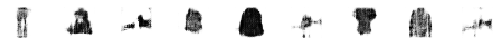

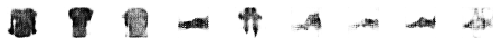

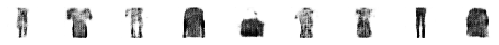

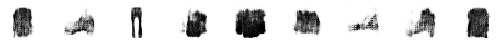

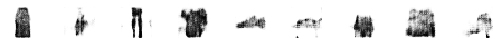

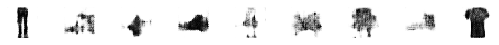

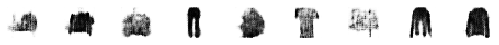

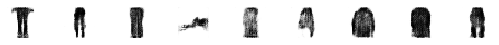

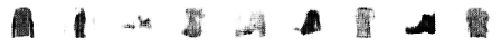

Epoch:6, Step:410, C-Loss:0.035 G-Loss:1.381
Epoch:6, Step:420, C-Loss:-1.063 G-Loss:2.078
Epoch:6, Step:430, C-Loss:-0.354 G-Loss:2.144
Epoch:6, Step:440, C-Loss:-1.280 G-Loss:1.903
Epoch:6, Step:450, C-Loss:-1.650 G-Loss:1.581
Epoch:6, Step:460, C-Loss:-2.166 G-Loss:1.801
Epoch:6, Step:470, C-Loss:-0.933 G-Loss:1.881
Epoch:6, Step:480, C-Loss:-1.295 G-Loss:1.683
Epoch:6, Step:490, C-Loss:-1.194 G-Loss:1.733
Epoch:7, Step:0, C-Loss:-0.409 G-Loss:1.692


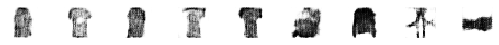

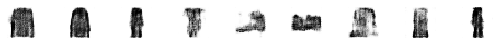

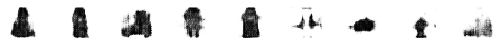

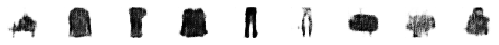

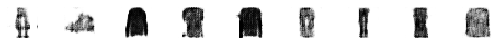

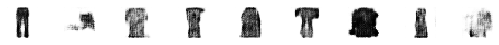

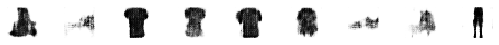

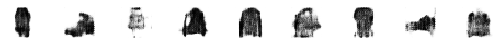

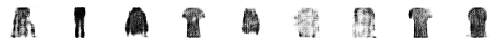

Epoch:7, Step:10, C-Loss:-1.302 G-Loss:1.388
Epoch:7, Step:20, C-Loss:-0.417 G-Loss:1.831
Epoch:7, Step:30, C-Loss:-0.690 G-Loss:1.816
Epoch:7, Step:40, C-Loss:-1.288 G-Loss:2.176
Epoch:7, Step:50, C-Loss:-1.143 G-Loss:1.655
Epoch:7, Step:60, C-Loss:-1.681 G-Loss:1.718
Epoch:7, Step:70, C-Loss:-1.242 G-Loss:1.561
Epoch:7, Step:80, C-Loss:-1.278 G-Loss:1.935
Epoch:7, Step:90, C-Loss:-1.360 G-Loss:1.573
Epoch:7, Step:100, C-Loss:-1.403 G-Loss:2.290


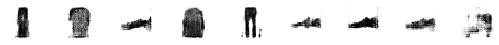

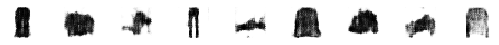

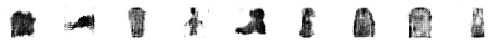

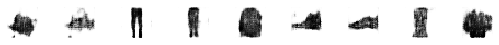

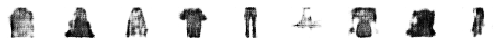

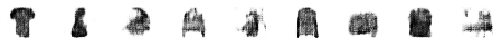

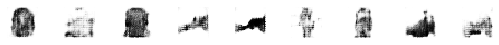

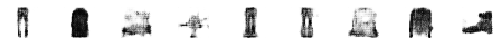

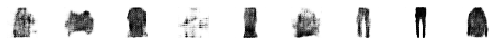

Epoch:7, Step:110, C-Loss:-1.456 G-Loss:1.663
Epoch:7, Step:120, C-Loss:-1.326 G-Loss:1.765
Epoch:7, Step:130, C-Loss:-1.401 G-Loss:1.896
Epoch:7, Step:140, C-Loss:-1.588 G-Loss:2.427
Epoch:7, Step:150, C-Loss:-1.471 G-Loss:2.075
Epoch:7, Step:160, C-Loss:-0.688 G-Loss:0.872
Epoch:7, Step:170, C-Loss:-0.347 G-Loss:1.290
Epoch:7, Step:180, C-Loss:-0.973 G-Loss:1.424
Epoch:7, Step:190, C-Loss:-0.831 G-Loss:2.009
Epoch:7, Step:200, C-Loss:-1.270 G-Loss:2.239


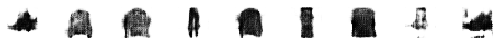

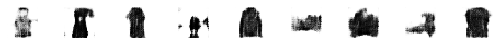

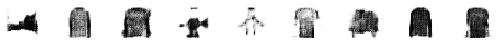

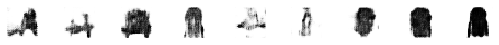

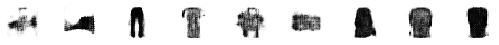

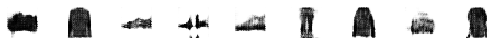

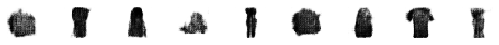

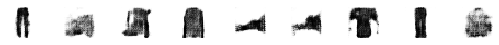

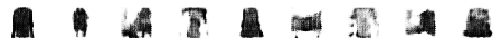

Epoch:7, Step:210, C-Loss:-1.404 G-Loss:1.405
Epoch:7, Step:220, C-Loss:-1.675 G-Loss:2.002
Epoch:7, Step:230, C-Loss:-1.584 G-Loss:1.178
Epoch:7, Step:240, C-Loss:-1.187 G-Loss:1.511
Epoch:7, Step:250, C-Loss:-0.826 G-Loss:1.674
Epoch:7, Step:260, C-Loss:-0.860 G-Loss:1.891
Epoch:7, Step:270, C-Loss:-1.497 G-Loss:1.439
Epoch:7, Step:280, C-Loss:-1.006 G-Loss:1.623
Epoch:7, Step:290, C-Loss:-1.115 G-Loss:1.987
Epoch:7, Step:300, C-Loss:-1.358 G-Loss:1.472


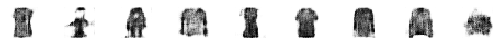

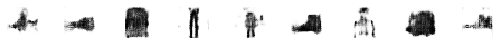

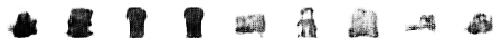

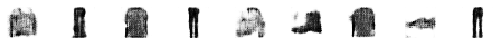

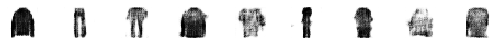

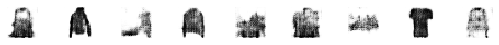

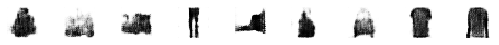

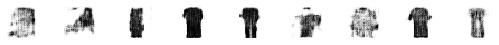

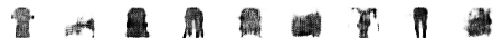

Epoch:7, Step:310, C-Loss:-0.945 G-Loss:2.071
Epoch:7, Step:320, C-Loss:-1.105 G-Loss:2.117
Epoch:7, Step:330, C-Loss:-1.209 G-Loss:1.257
Epoch:7, Step:340, C-Loss:-1.497 G-Loss:1.677
Epoch:7, Step:350, C-Loss:-0.742 G-Loss:1.245
Epoch:7, Step:360, C-Loss:-0.862 G-Loss:1.695
Epoch:7, Step:370, C-Loss:-1.883 G-Loss:1.461
Epoch:7, Step:380, C-Loss:-0.901 G-Loss:1.339
Epoch:7, Step:390, C-Loss:-1.744 G-Loss:0.949
Epoch:7, Step:400, C-Loss:-1.261 G-Loss:1.594


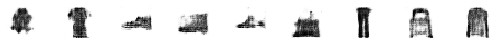

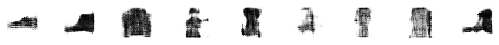

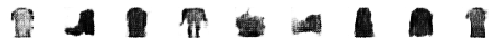

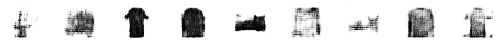

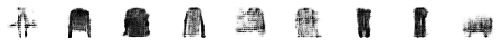

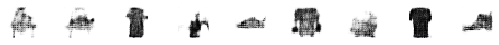

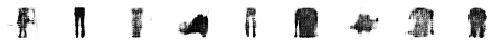

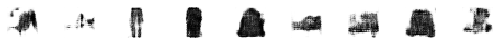

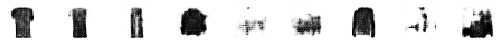

Epoch:7, Step:410, C-Loss:-0.744 G-Loss:1.181
Epoch:7, Step:420, C-Loss:0.011 G-Loss:1.561
Epoch:7, Step:430, C-Loss:-1.578 G-Loss:1.562
Epoch:7, Step:440, C-Loss:-1.113 G-Loss:1.857
Epoch:7, Step:450, C-Loss:-1.481 G-Loss:1.883
Epoch:7, Step:460, C-Loss:-1.461 G-Loss:2.047
Epoch:7, Step:470, C-Loss:-1.374 G-Loss:2.229
Epoch:7, Step:480, C-Loss:-0.703 G-Loss:1.392
Epoch:7, Step:490, C-Loss:-1.283 G-Loss:2.384
Epoch:8, Step:0, C-Loss:-1.043 G-Loss:1.390


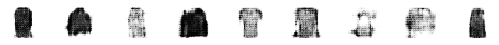

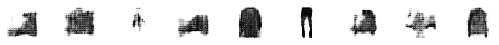

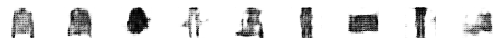

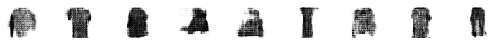

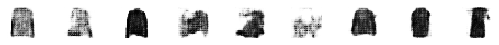

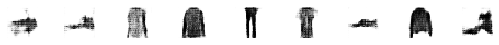

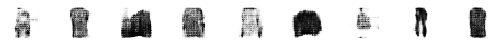

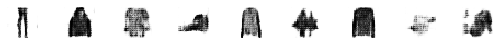

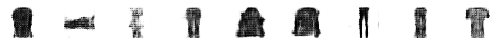

Epoch:8, Step:10, C-Loss:-1.005 G-Loss:2.225
Epoch:8, Step:20, C-Loss:-0.762 G-Loss:1.719
Epoch:8, Step:30, C-Loss:-0.892 G-Loss:2.157
Epoch:8, Step:40, C-Loss:-0.963 G-Loss:1.225
Epoch:8, Step:50, C-Loss:-1.041 G-Loss:1.358
Epoch:8, Step:60, C-Loss:-0.986 G-Loss:1.453
Epoch:8, Step:70, C-Loss:-1.454 G-Loss:1.644
Epoch:8, Step:80, C-Loss:-0.882 G-Loss:1.346
Epoch:8, Step:90, C-Loss:-1.421 G-Loss:2.145
Epoch:8, Step:100, C-Loss:-0.530 G-Loss:1.562


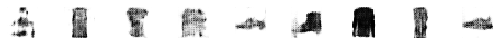

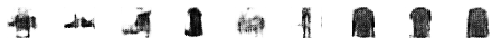

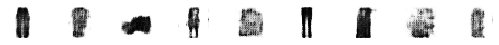

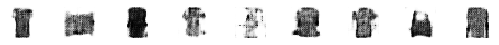

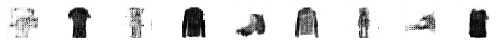

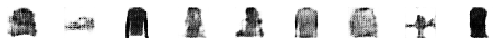

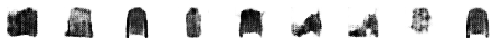

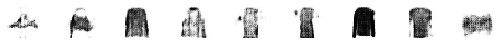

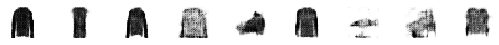

Epoch:8, Step:110, C-Loss:-1.110 G-Loss:1.945
Epoch:8, Step:120, C-Loss:-1.123 G-Loss:1.883
Epoch:8, Step:130, C-Loss:-0.461 G-Loss:1.687
Epoch:8, Step:140, C-Loss:-0.523 G-Loss:1.696
Epoch:8, Step:150, C-Loss:-1.056 G-Loss:1.688
Epoch:8, Step:160, C-Loss:-0.365 G-Loss:1.394
Epoch:8, Step:170, C-Loss:0.031 G-Loss:1.610
Epoch:8, Step:180, C-Loss:-0.911 G-Loss:1.180
Epoch:8, Step:190, C-Loss:-0.660 G-Loss:1.491
Epoch:8, Step:200, C-Loss:-0.886 G-Loss:1.343


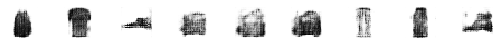

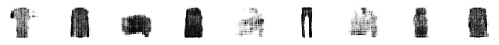

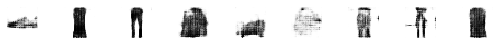

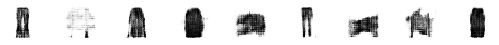

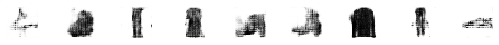

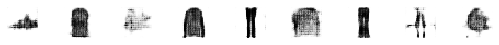

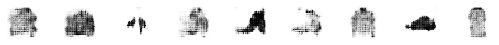

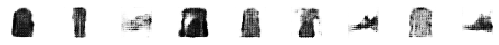

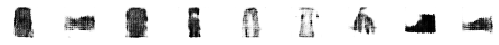

Epoch:8, Step:210, C-Loss:-1.264 G-Loss:0.620
Epoch:8, Step:220, C-Loss:-1.547 G-Loss:1.519
Epoch:8, Step:230, C-Loss:-0.789 G-Loss:0.929
Epoch:8, Step:240, C-Loss:-0.856 G-Loss:1.603
Epoch:8, Step:250, C-Loss:-0.654 G-Loss:1.874
Epoch:8, Step:260, C-Loss:-1.550 G-Loss:1.800
Epoch:8, Step:270, C-Loss:-1.165 G-Loss:1.146
Epoch:8, Step:280, C-Loss:-0.796 G-Loss:1.430
Epoch:8, Step:290, C-Loss:-1.876 G-Loss:2.027
Epoch:8, Step:300, C-Loss:-0.918 G-Loss:1.713


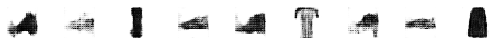

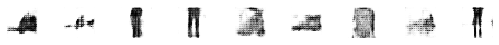

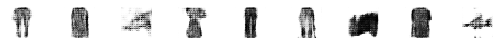

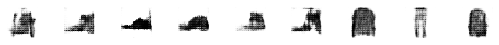

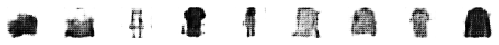

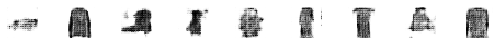

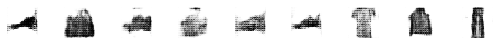

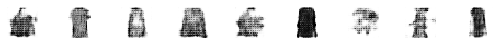

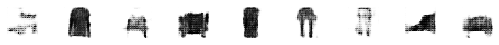

Epoch:8, Step:310, C-Loss:-0.593 G-Loss:1.310
Epoch:8, Step:320, C-Loss:-1.466 G-Loss:1.672
Epoch:8, Step:330, C-Loss:-1.215 G-Loss:1.342
Epoch:8, Step:340, C-Loss:-1.274 G-Loss:2.187
Epoch:8, Step:350, C-Loss:-0.457 G-Loss:2.290
Epoch:8, Step:360, C-Loss:-0.597 G-Loss:1.795
Epoch:8, Step:370, C-Loss:-1.637 G-Loss:1.673
Epoch:8, Step:380, C-Loss:-0.459 G-Loss:1.709
Epoch:8, Step:390, C-Loss:-1.883 G-Loss:1.449
Epoch:8, Step:400, C-Loss:-0.837 G-Loss:1.454


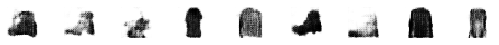

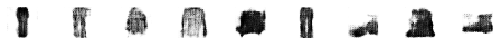

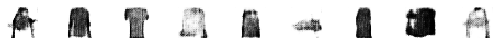

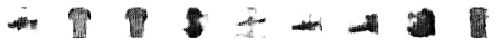

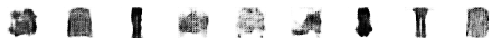

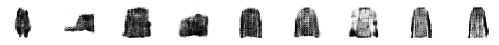

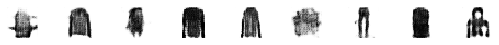

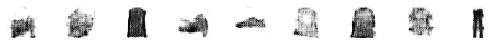

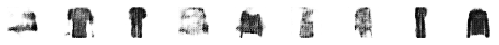

Epoch:8, Step:410, C-Loss:-0.024 G-Loss:1.110
Epoch:8, Step:420, C-Loss:0.018 G-Loss:0.963
Epoch:8, Step:430, C-Loss:-1.415 G-Loss:1.130
Epoch:8, Step:440, C-Loss:-1.169 G-Loss:1.378
Epoch:8, Step:450, C-Loss:-1.119 G-Loss:1.292
Epoch:8, Step:460, C-Loss:-0.907 G-Loss:1.332
Epoch:8, Step:470, C-Loss:-0.988 G-Loss:0.844
Epoch:8, Step:480, C-Loss:-0.430 G-Loss:1.717
Epoch:8, Step:490, C-Loss:-1.395 G-Loss:1.468
Epoch:9, Step:0, C-Loss:-1.014 G-Loss:0.848


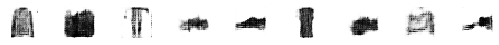

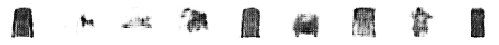

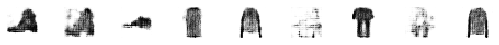

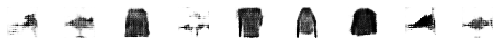

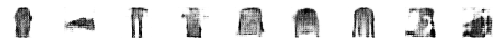

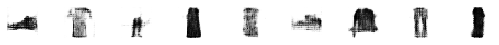

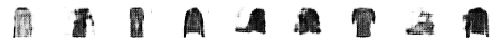

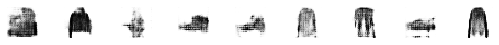

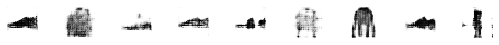

Epoch:9, Step:10, C-Loss:-0.394 G-Loss:1.247
Epoch:9, Step:20, C-Loss:-1.003 G-Loss:1.845
Epoch:9, Step:30, C-Loss:-0.525 G-Loss:1.151
Epoch:9, Step:40, C-Loss:-0.657 G-Loss:1.115
Epoch:9, Step:50, C-Loss:-1.429 G-Loss:1.331
Epoch:9, Step:60, C-Loss:-0.787 G-Loss:0.969
Epoch:9, Step:70, C-Loss:-0.716 G-Loss:0.821
Epoch:9, Step:80, C-Loss:-0.732 G-Loss:2.113
Epoch:9, Step:90, C-Loss:-0.439 G-Loss:1.821
Epoch:9, Step:100, C-Loss:-0.596 G-Loss:1.494


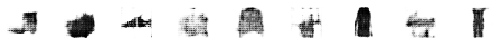

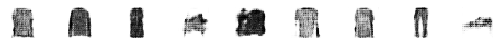

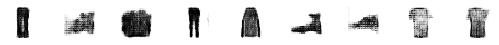

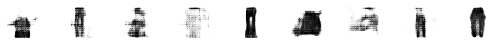

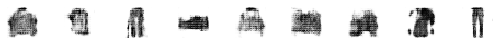

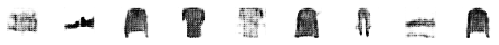

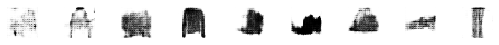

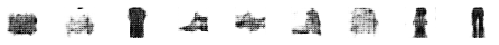

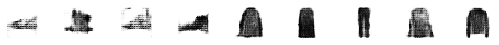

Epoch:9, Step:110, C-Loss:-1.264 G-Loss:1.405
Epoch:9, Step:120, C-Loss:-1.519 G-Loss:1.429
Epoch:9, Step:130, C-Loss:-0.130 G-Loss:1.145
Epoch:9, Step:140, C-Loss:-0.898 G-Loss:1.058
Epoch:9, Step:150, C-Loss:-0.529 G-Loss:1.863
Epoch:9, Step:160, C-Loss:-0.993 G-Loss:1.085
Epoch:9, Step:170, C-Loss:-0.957 G-Loss:1.447
Epoch:9, Step:180, C-Loss:-1.065 G-Loss:1.161
Epoch:9, Step:190, C-Loss:-0.913 G-Loss:0.836
Epoch:9, Step:200, C-Loss:-1.031 G-Loss:1.406


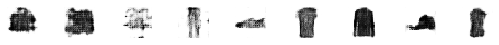

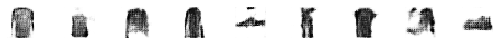

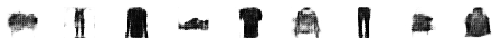

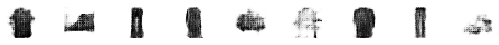

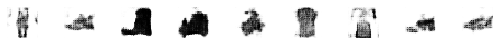

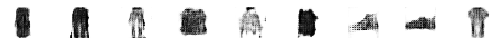

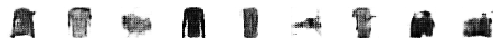

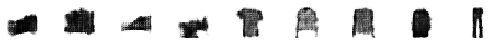

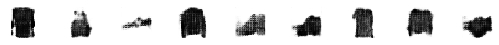

Epoch:9, Step:210, C-Loss:-0.377 G-Loss:0.940
Epoch:9, Step:220, C-Loss:-1.215 G-Loss:1.649
Epoch:9, Step:230, C-Loss:-0.621 G-Loss:1.910
Epoch:9, Step:240, C-Loss:-0.776 G-Loss:1.206
Epoch:9, Step:250, C-Loss:-0.534 G-Loss:0.593
Epoch:9, Step:260, C-Loss:-1.452 G-Loss:0.638
Epoch:9, Step:270, C-Loss:-0.098 G-Loss:0.476
Epoch:9, Step:280, C-Loss:-0.179 G-Loss:1.224
Epoch:9, Step:290, C-Loss:-1.666 G-Loss:0.969
Epoch:9, Step:300, C-Loss:-1.067 G-Loss:1.416


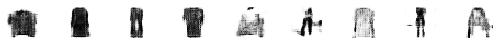

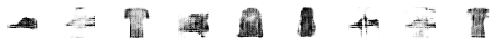

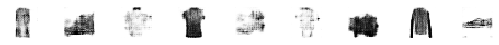

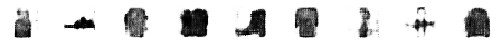

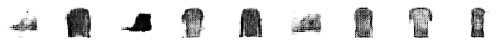

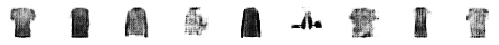

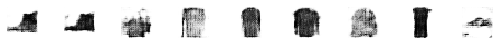

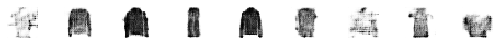

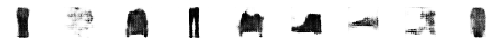

Epoch:9, Step:310, C-Loss:0.006 G-Loss:0.428
Epoch:9, Step:320, C-Loss:-0.991 G-Loss:0.775
Epoch:9, Step:330, C-Loss:-0.442 G-Loss:0.718
Epoch:9, Step:340, C-Loss:-1.161 G-Loss:1.270
Epoch:9, Step:350, C-Loss:-0.524 G-Loss:0.937
Epoch:9, Step:360, C-Loss:-0.839 G-Loss:1.344
Epoch:9, Step:370, C-Loss:-1.241 G-Loss:0.771
Epoch:9, Step:380, C-Loss:-1.164 G-Loss:1.539
Epoch:9, Step:390, C-Loss:-0.974 G-Loss:1.067
Epoch:9, Step:400, C-Loss:-1.344 G-Loss:1.260


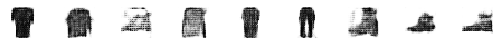

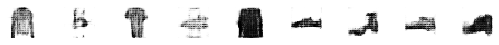

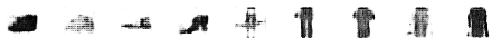

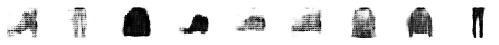

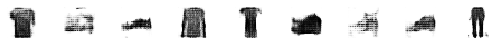

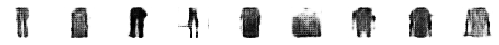

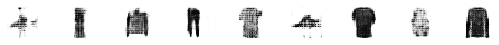

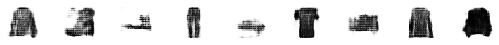

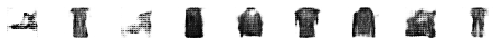

Epoch:9, Step:410, C-Loss:-1.820 G-Loss:1.389
Epoch:9, Step:420, C-Loss:-1.211 G-Loss:1.174
Epoch:9, Step:430, C-Loss:-0.648 G-Loss:2.169
Epoch:9, Step:440, C-Loss:-1.377 G-Loss:0.988
Epoch:9, Step:450, C-Loss:-1.666 G-Loss:1.623
Epoch:9, Step:460, C-Loss:-0.681 G-Loss:1.351
Epoch:9, Step:470, C-Loss:-1.208 G-Loss:1.033
Epoch:9, Step:480, C-Loss:-0.520 G-Loss:0.492
Epoch:9, Step:490, C-Loss:-0.891 G-Loss:0.808
Epoch:10, Step:0, C-Loss:-0.015 G-Loss:0.934


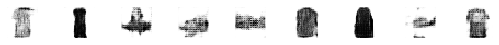

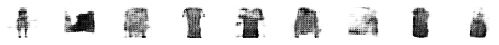

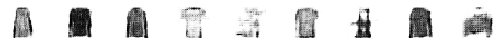

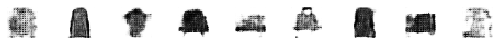

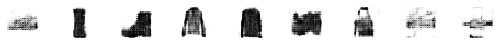

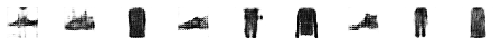

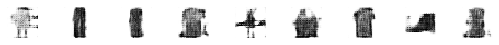

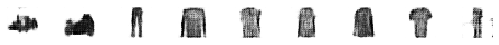

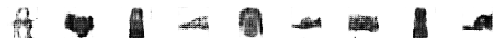

Epoch:10, Step:10, C-Loss:-0.212 G-Loss:0.036
Epoch:10, Step:20, C-Loss:-0.244 G-Loss:0.322
Epoch:10, Step:30, C-Loss:-1.320 G-Loss:0.976
Epoch:10, Step:40, C-Loss:-0.545 G-Loss:0.901
Epoch:10, Step:50, C-Loss:-0.931 G-Loss:0.541
Epoch:10, Step:60, C-Loss:-0.810 G-Loss:0.229
Epoch:10, Step:70, C-Loss:-0.145 G-Loss:0.632
Epoch:10, Step:80, C-Loss:-1.279 G-Loss:1.107
Epoch:10, Step:90, C-Loss:-0.093 G-Loss:1.072
Epoch:10, Step:100, C-Loss:-1.308 G-Loss:0.900


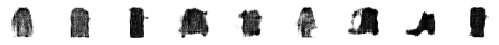

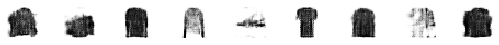

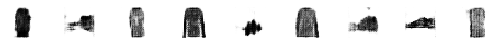

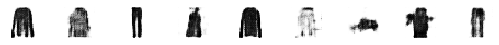

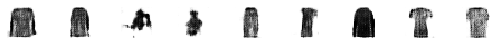

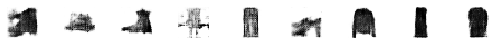

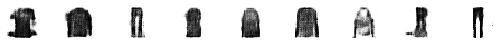

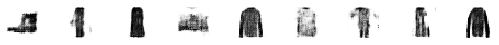

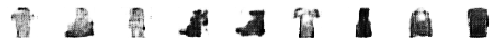

Epoch:10, Step:110, C-Loss:-0.858 G-Loss:0.731
Epoch:10, Step:120, C-Loss:-1.394 G-Loss:0.228
Epoch:10, Step:130, C-Loss:-0.929 G-Loss:0.515
Epoch:10, Step:140, C-Loss:-1.457 G-Loss:0.660
Epoch:10, Step:150, C-Loss:-0.499 G-Loss:0.389
Epoch:10, Step:160, C-Loss:-0.119 G-Loss:0.779
Epoch:10, Step:170, C-Loss:-1.067 G-Loss:0.694
Epoch:10, Step:180, C-Loss:-0.628 G-Loss:0.642
Epoch:10, Step:190, C-Loss:-1.037 G-Loss:1.413
Epoch:10, Step:200, C-Loss:-0.980 G-Loss:0.610


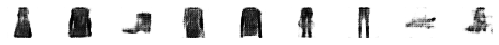

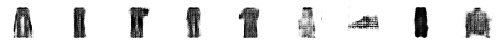

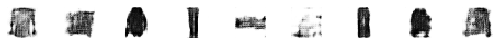

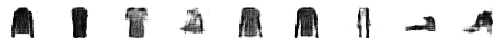

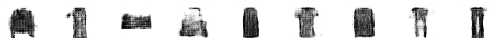

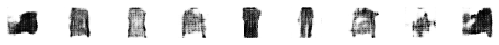

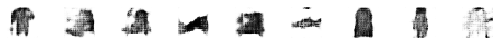

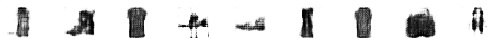

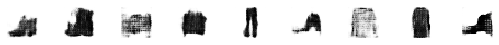

Epoch:10, Step:210, C-Loss:-1.281 G-Loss:1.288
Epoch:10, Step:220, C-Loss:-0.581 G-Loss:0.730
Epoch:10, Step:230, C-Loss:-0.678 G-Loss:1.051
Epoch:10, Step:240, C-Loss:-0.813 G-Loss:0.945
Epoch:10, Step:250, C-Loss:-0.755 G-Loss:1.026
Epoch:10, Step:260, C-Loss:-1.113 G-Loss:0.545
Epoch:10, Step:270, C-Loss:-1.004 G-Loss:0.340
Epoch:10, Step:280, C-Loss:-0.637 G-Loss:1.021
Epoch:10, Step:290, C-Loss:-1.130 G-Loss:0.848
Epoch:10, Step:300, C-Loss:-0.984 G-Loss:0.697


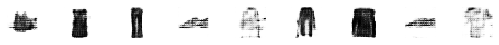

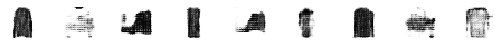

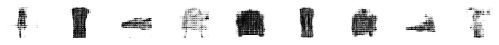

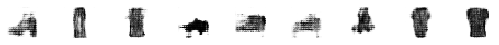

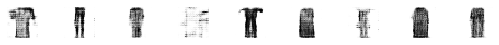

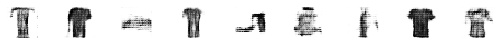

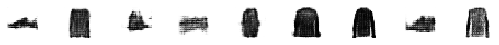

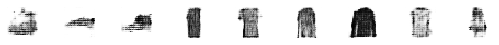

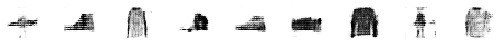

Epoch:10, Step:310, C-Loss:-1.054 G-Loss:0.586
Epoch:10, Step:320, C-Loss:-1.087 G-Loss:0.820
Epoch:10, Step:330, C-Loss:-1.308 G-Loss:0.859
Epoch:10, Step:340, C-Loss:-0.929 G-Loss:0.462
Epoch:10, Step:350, C-Loss:-0.374 G-Loss:0.440
Epoch:10, Step:360, C-Loss:-1.316 G-Loss:0.476
Epoch:10, Step:370, C-Loss:-0.794 G-Loss:0.277
Epoch:10, Step:380, C-Loss:-0.024 G-Loss:1.257
Epoch:10, Step:390, C-Loss:-1.061 G-Loss:1.337
Epoch:10, Step:400, C-Loss:-0.140 G-Loss:1.482


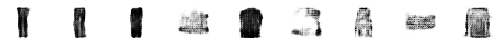

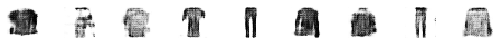

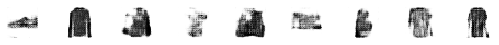

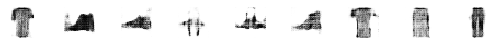

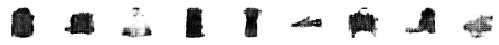

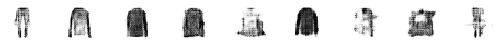

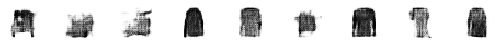

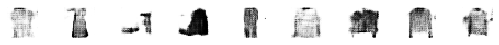

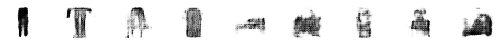

Epoch:10, Step:410, C-Loss:-0.827 G-Loss:0.699
Epoch:10, Step:420, C-Loss:-0.831 G-Loss:1.275
Epoch:10, Step:430, C-Loss:-1.152 G-Loss:0.769
Epoch:10, Step:440, C-Loss:-0.929 G-Loss:0.810
Epoch:10, Step:450, C-Loss:-0.988 G-Loss:0.408
Epoch:10, Step:460, C-Loss:-1.050 G-Loss:1.298
Epoch:10, Step:470, C-Loss:-1.224 G-Loss:0.760
Epoch:10, Step:480, C-Loss:-0.615 G-Loss:0.512
Epoch:10, Step:490, C-Loss:-0.492 G-Loss:1.049
Epoch:11, Step:0, C-Loss:-1.109 G-Loss:0.496


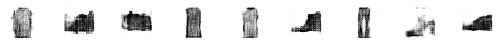

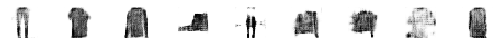

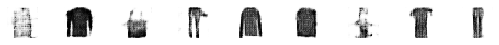

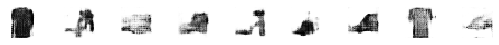

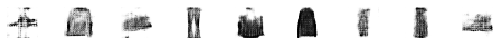

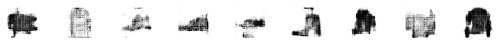

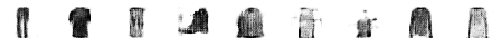

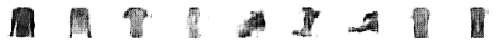

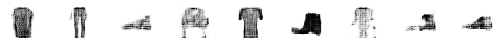

Epoch:11, Step:10, C-Loss:-0.068 G-Loss:0.728
Epoch:11, Step:20, C-Loss:-0.755 G-Loss:0.463
Epoch:11, Step:30, C-Loss:-0.587 G-Loss:1.714
Epoch:11, Step:40, C-Loss:-1.182 G-Loss:1.109
Epoch:11, Step:50, C-Loss:-0.313 G-Loss:1.129
Epoch:11, Step:60, C-Loss:-0.158 G-Loss:0.722
Epoch:11, Step:70, C-Loss:-0.864 G-Loss:0.969
Epoch:11, Step:80, C-Loss:-0.830 G-Loss:0.177
Epoch:11, Step:90, C-Loss:0.082 G-Loss:0.615
Epoch:11, Step:100, C-Loss:-0.466 G-Loss:0.150


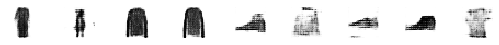

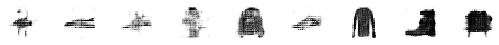

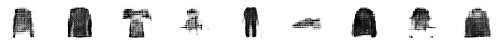

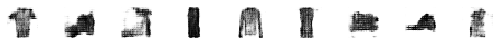

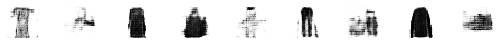

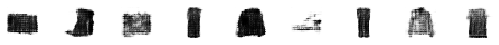

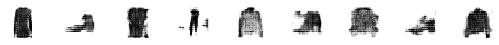

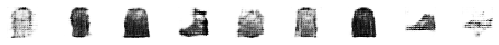

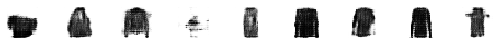

Epoch:11, Step:110, C-Loss:-0.489 G-Loss:1.300
Epoch:11, Step:120, C-Loss:-1.364 G-Loss:1.197
Epoch:11, Step:130, C-Loss:-0.675 G-Loss:1.531
Epoch:11, Step:140, C-Loss:-0.519 G-Loss:1.149
Epoch:11, Step:150, C-Loss:-0.287 G-Loss:1.549
Epoch:11, Step:160, C-Loss:-0.937 G-Loss:1.093
Epoch:11, Step:170, C-Loss:-0.857 G-Loss:0.822
Epoch:11, Step:180, C-Loss:-0.620 G-Loss:0.728
Epoch:11, Step:190, C-Loss:-1.285 G-Loss:0.806
Epoch:11, Step:200, C-Loss:-1.256 G-Loss:0.982


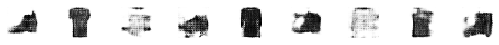

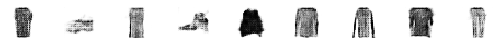

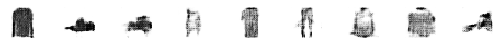

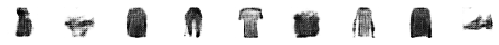

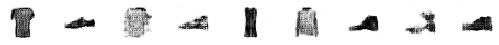

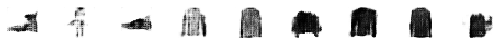

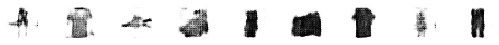

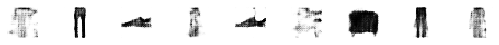

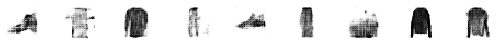

Epoch:11, Step:210, C-Loss:-1.136 G-Loss:0.535
Epoch:11, Step:220, C-Loss:-0.843 G-Loss:0.455
Epoch:11, Step:230, C-Loss:-0.370 G-Loss:0.595
Epoch:11, Step:240, C-Loss:-0.496 G-Loss:1.074
Epoch:11, Step:250, C-Loss:-0.506 G-Loss:0.723
Epoch:11, Step:260, C-Loss:-1.347 G-Loss:1.693
Epoch:11, Step:270, C-Loss:-0.720 G-Loss:0.388
Epoch:11, Step:280, C-Loss:-0.951 G-Loss:0.798
Epoch:11, Step:290, C-Loss:-0.639 G-Loss:1.062
Epoch:11, Step:300, C-Loss:-0.985 G-Loss:0.926


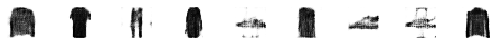

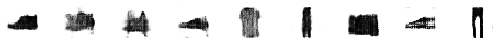

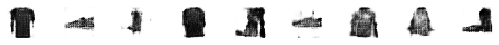

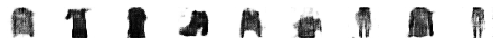

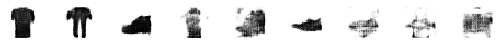

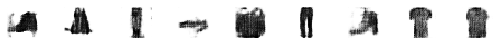

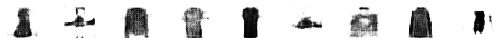

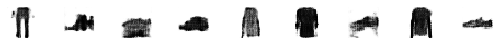

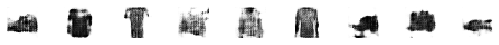

Epoch:11, Step:310, C-Loss:-0.500 G-Loss:0.387
Epoch:11, Step:320, C-Loss:-0.477 G-Loss:0.616
Epoch:11, Step:330, C-Loss:-0.688 G-Loss:0.221
Epoch:11, Step:340, C-Loss:-0.771 G-Loss:0.779
Epoch:11, Step:350, C-Loss:-0.365 G-Loss:0.511
Epoch:11, Step:360, C-Loss:-0.877 G-Loss:0.007
Epoch:11, Step:370, C-Loss:-0.943 G-Loss:-0.167
Epoch:11, Step:380, C-Loss:-1.046 G-Loss:0.365
Epoch:11, Step:390, C-Loss:-0.532 G-Loss:0.679
Epoch:11, Step:400, C-Loss:-0.609 G-Loss:0.387


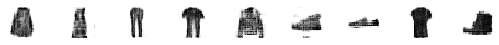

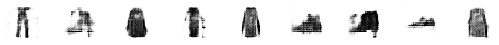

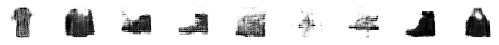

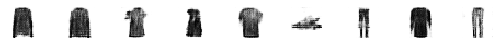

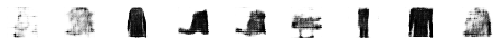

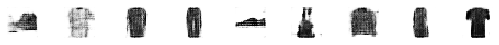

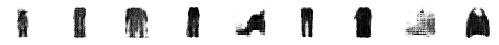

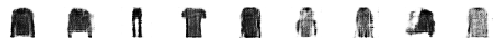

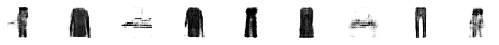

Epoch:11, Step:410, C-Loss:-0.327 G-Loss:0.988
Epoch:11, Step:420, C-Loss:-0.638 G-Loss:1.070
Epoch:11, Step:430, C-Loss:-1.012 G-Loss:1.273
Epoch:11, Step:440, C-Loss:-0.611 G-Loss:1.201
Epoch:11, Step:450, C-Loss:-0.104 G-Loss:0.616
Epoch:11, Step:460, C-Loss:-0.490 G-Loss:0.998
Epoch:11, Step:470, C-Loss:-0.523 G-Loss:0.566
Epoch:11, Step:480, C-Loss:-1.066 G-Loss:1.013
Epoch:11, Step:490, C-Loss:0.037 G-Loss:1.032
Epoch:12, Step:0, C-Loss:-0.816 G-Loss:0.982


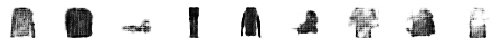

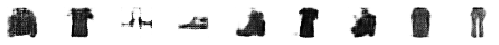

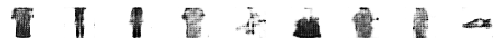

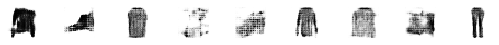

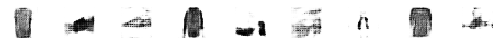

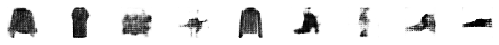

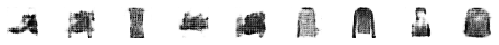

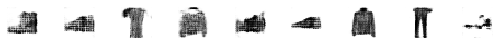

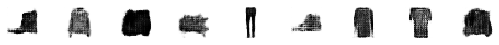

Epoch:12, Step:10, C-Loss:-0.293 G-Loss:1.524
Epoch:12, Step:20, C-Loss:-0.056 G-Loss:0.924
Epoch:12, Step:30, C-Loss:-0.948 G-Loss:0.436
Epoch:12, Step:40, C-Loss:-0.750 G-Loss:0.754
Epoch:12, Step:50, C-Loss:-0.592 G-Loss:0.809
Epoch:12, Step:60, C-Loss:-0.861 G-Loss:0.857
Epoch:12, Step:70, C-Loss:-0.165 G-Loss:0.431
Epoch:12, Step:80, C-Loss:-0.998 G-Loss:0.214
Epoch:12, Step:90, C-Loss:-1.606 G-Loss:0.447
Epoch:12, Step:100, C-Loss:-0.903 G-Loss:1.221


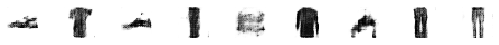

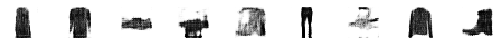

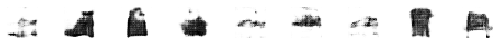

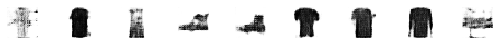

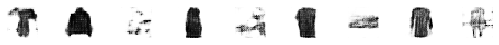

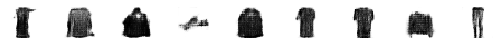

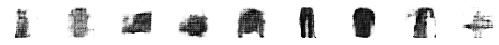

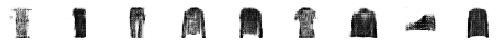

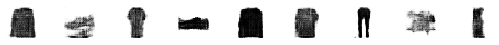

Epoch:12, Step:110, C-Loss:-0.424 G-Loss:0.979
Epoch:12, Step:120, C-Loss:-1.359 G-Loss:0.430
Epoch:12, Step:130, C-Loss:-1.330 G-Loss:-0.034
Epoch:12, Step:140, C-Loss:-1.129 G-Loss:0.918
Epoch:12, Step:150, C-Loss:-0.978 G-Loss:0.423
Epoch:12, Step:160, C-Loss:-1.275 G-Loss:0.204
Epoch:12, Step:170, C-Loss:-0.745 G-Loss:0.468
Epoch:12, Step:180, C-Loss:-0.506 G-Loss:0.139
Epoch:12, Step:190, C-Loss:-0.785 G-Loss:0.965
Epoch:12, Step:200, C-Loss:-0.351 G-Loss:0.322


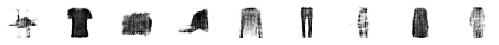

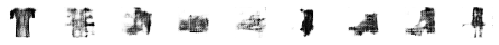

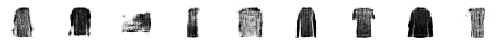

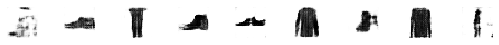

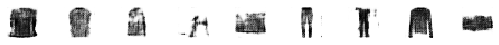

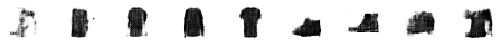

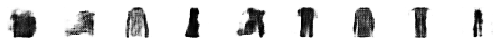

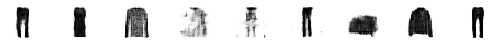

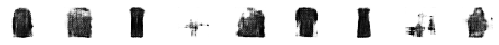

Epoch:12, Step:210, C-Loss:-0.758 G-Loss:1.236
Epoch:12, Step:220, C-Loss:-0.175 G-Loss:0.277
Epoch:12, Step:230, C-Loss:-0.783 G-Loss:0.345
Epoch:12, Step:240, C-Loss:-1.127 G-Loss:0.417
Epoch:12, Step:250, C-Loss:-0.457 G-Loss:0.792
Epoch:12, Step:260, C-Loss:-0.431 G-Loss:0.476
Epoch:12, Step:270, C-Loss:-0.556 G-Loss:0.335
Epoch:12, Step:280, C-Loss:-0.300 G-Loss:0.328
Epoch:12, Step:290, C-Loss:-0.740 G-Loss:0.654
Epoch:12, Step:300, C-Loss:-0.297 G-Loss:0.181


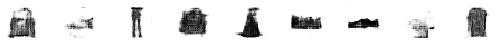

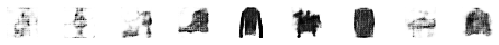

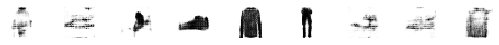

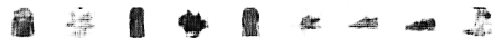

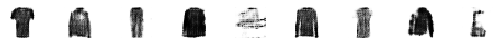

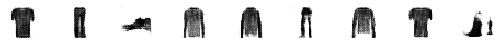

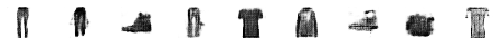

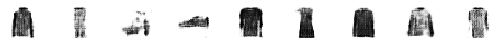

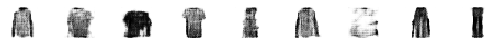

Epoch:12, Step:310, C-Loss:-0.130 G-Loss:0.218
Epoch:12, Step:320, C-Loss:0.074 G-Loss:0.085
Epoch:12, Step:330, C-Loss:-0.402 G-Loss:0.248
Epoch:12, Step:340, C-Loss:-0.784 G-Loss:0.277
Epoch:12, Step:350, C-Loss:-0.712 G-Loss:0.590
Epoch:12, Step:360, C-Loss:-0.581 G-Loss:0.085
Epoch:12, Step:370, C-Loss:-0.390 G-Loss:1.045
Epoch:12, Step:380, C-Loss:-1.120 G-Loss:0.752
Epoch:12, Step:390, C-Loss:-0.322 G-Loss:0.103
Epoch:12, Step:400, C-Loss:-1.110 G-Loss:-0.267


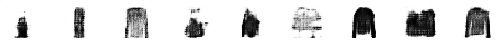

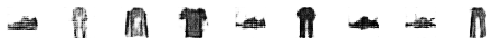

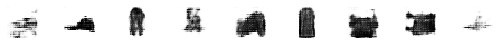

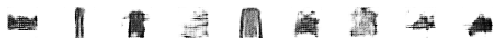

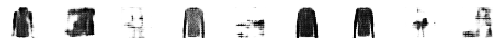

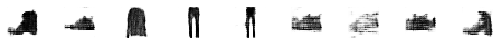

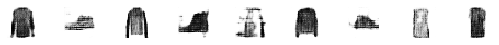

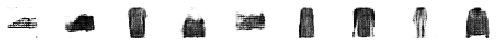

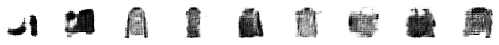

Epoch:12, Step:410, C-Loss:-0.598 G-Loss:0.744
Epoch:12, Step:420, C-Loss:-0.940 G-Loss:-0.368
Epoch:12, Step:430, C-Loss:-0.918 G-Loss:0.206
Epoch:12, Step:440, C-Loss:-0.685 G-Loss:0.324
Epoch:12, Step:450, C-Loss:0.254 G-Loss:0.941
Epoch:12, Step:460, C-Loss:-0.902 G-Loss:0.040
Epoch:12, Step:470, C-Loss:-1.185 G-Loss:0.627
Epoch:12, Step:480, C-Loss:-0.225 G-Loss:0.316
Epoch:12, Step:490, C-Loss:-2.173 G-Loss:-0.227
Epoch:13, Step:0, C-Loss:-0.408 G-Loss:0.361


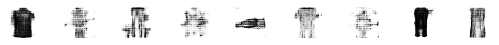

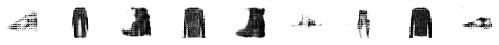

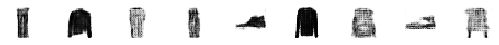

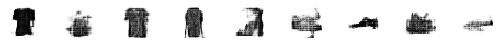

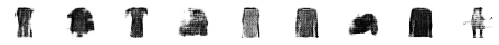

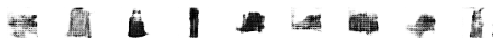

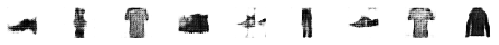

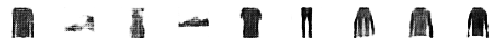

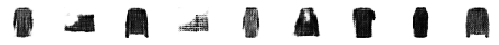

Epoch:13, Step:10, C-Loss:-0.545 G-Loss:1.197
Epoch:13, Step:20, C-Loss:-0.449 G-Loss:0.560
Epoch:13, Step:30, C-Loss:-1.023 G-Loss:0.412
Epoch:13, Step:40, C-Loss:-1.603 G-Loss:0.608
Epoch:13, Step:50, C-Loss:-0.183 G-Loss:0.020
Epoch:13, Step:60, C-Loss:-0.049 G-Loss:-0.037
Epoch:13, Step:70, C-Loss:-1.093 G-Loss:0.517
Epoch:13, Step:80, C-Loss:-0.762 G-Loss:0.307
Epoch:13, Step:90, C-Loss:-0.319 G-Loss:0.560
Epoch:13, Step:100, C-Loss:-0.720 G-Loss:0.514


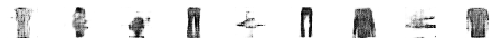

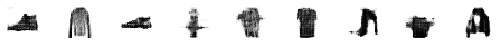

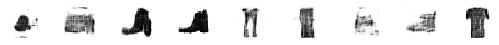

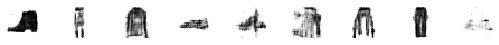

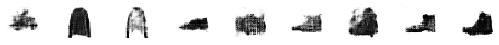

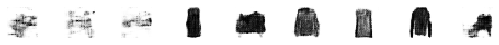

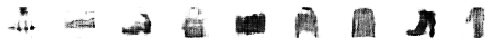

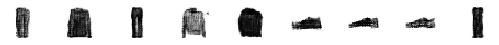

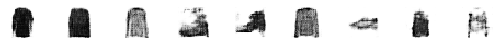

Epoch:13, Step:110, C-Loss:-1.415 G-Loss:-0.090
Epoch:13, Step:120, C-Loss:-0.543 G-Loss:0.061
Epoch:13, Step:130, C-Loss:-1.426 G-Loss:0.178
Epoch:13, Step:140, C-Loss:-0.764 G-Loss:0.370
Epoch:13, Step:150, C-Loss:-0.199 G-Loss:0.213
Epoch:13, Step:160, C-Loss:-0.480 G-Loss:0.009
Epoch:13, Step:170, C-Loss:-1.226 G-Loss:-0.226
Epoch:13, Step:180, C-Loss:-1.771 G-Loss:0.344
Epoch:13, Step:190, C-Loss:-1.467 G-Loss:-0.145
Epoch:13, Step:200, C-Loss:-1.127 G-Loss:-0.310


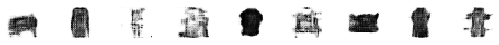

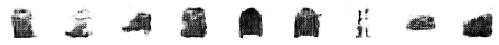

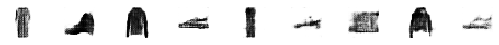

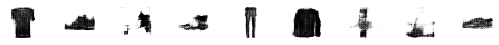

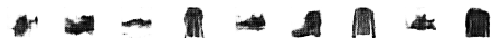

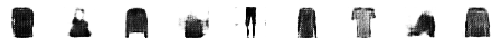

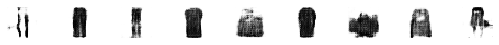

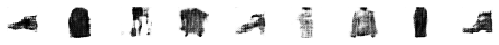

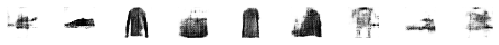

Epoch:13, Step:210, C-Loss:-1.511 G-Loss:0.269
Epoch:13, Step:220, C-Loss:-0.964 G-Loss:0.554
Epoch:13, Step:230, C-Loss:-0.762 G-Loss:-0.250
Epoch:13, Step:240, C-Loss:-1.139 G-Loss:0.535
Epoch:13, Step:250, C-Loss:0.115 G-Loss:0.271
Epoch:13, Step:260, C-Loss:-0.951 G-Loss:0.296
Epoch:13, Step:270, C-Loss:-0.833 G-Loss:0.085
Epoch:13, Step:280, C-Loss:-0.428 G-Loss:0.745
Epoch:13, Step:290, C-Loss:-0.751 G-Loss:0.718
Epoch:13, Step:300, C-Loss:-0.528 G-Loss:0.447


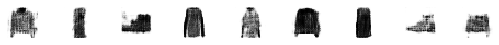

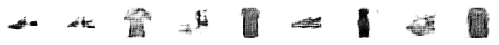

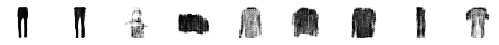

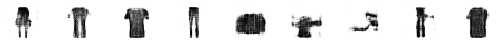

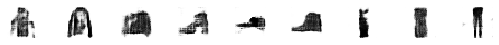

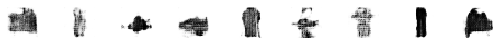

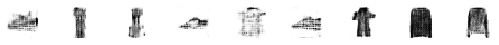

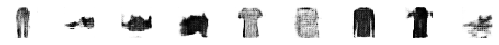

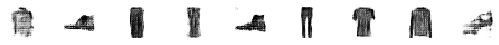

Epoch:13, Step:310, C-Loss:-0.975 G-Loss:0.420
Epoch:13, Step:320, C-Loss:-0.460 G-Loss:1.085
Epoch:13, Step:330, C-Loss:-0.889 G-Loss:-0.134
Epoch:13, Step:340, C-Loss:-0.555 G-Loss:0.523
Epoch:13, Step:350, C-Loss:-0.177 G-Loss:0.707
Epoch:13, Step:360, C-Loss:-0.294 G-Loss:0.343
Epoch:13, Step:370, C-Loss:-0.856 G-Loss:0.172
Epoch:13, Step:380, C-Loss:-0.720 G-Loss:1.108
Epoch:13, Step:390, C-Loss:-0.063 G-Loss:1.064
Epoch:13, Step:400, C-Loss:-1.040 G-Loss:0.573


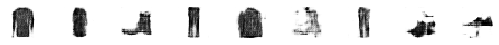

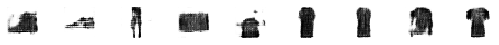

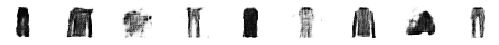

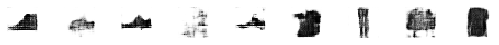

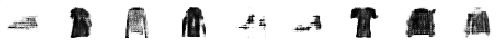

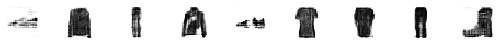

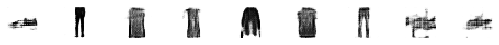

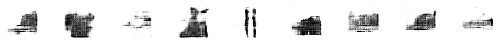

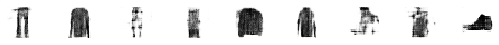

Epoch:13, Step:410, C-Loss:-1.214 G-Loss:0.020
Epoch:13, Step:420, C-Loss:-0.832 G-Loss:0.249
Epoch:13, Step:430, C-Loss:-0.037 G-Loss:0.887
Epoch:13, Step:440, C-Loss:-0.514 G-Loss:0.886
Epoch:13, Step:450, C-Loss:-0.423 G-Loss:0.875
Epoch:13, Step:460, C-Loss:-0.118 G-Loss:0.592
Epoch:13, Step:470, C-Loss:-0.041 G-Loss:0.137
Epoch:13, Step:480, C-Loss:0.134 G-Loss:-0.252
Epoch:13, Step:490, C-Loss:-0.184 G-Loss:-0.187
Epoch:14, Step:0, C-Loss:-0.354 G-Loss:-0.508


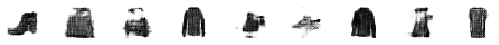

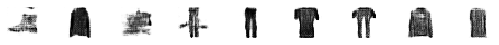

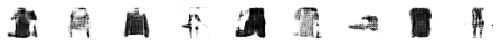

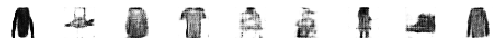

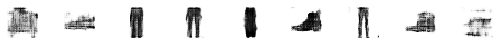

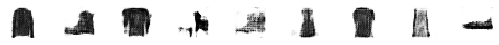

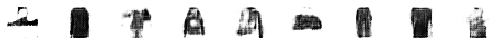

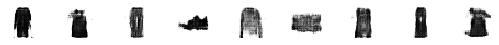

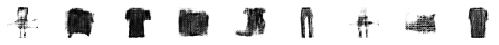

Epoch:14, Step:10, C-Loss:-0.133 G-Loss:-0.185
Epoch:14, Step:20, C-Loss:-0.070 G-Loss:0.158
Epoch:14, Step:30, C-Loss:-1.128 G-Loss:0.292
Epoch:14, Step:40, C-Loss:0.199 G-Loss:1.013
Epoch:14, Step:50, C-Loss:-0.968 G-Loss:0.833
Epoch:14, Step:60, C-Loss:-0.797 G-Loss:0.283
Epoch:14, Step:70, C-Loss:0.145 G-Loss:0.186
Epoch:14, Step:80, C-Loss:-0.637 G-Loss:0.435
Epoch:14, Step:90, C-Loss:-0.501 G-Loss:-0.306
Epoch:14, Step:100, C-Loss:-1.138 G-Loss:0.430


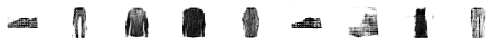

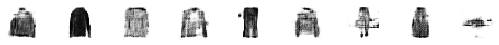

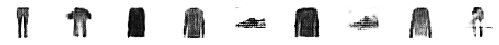

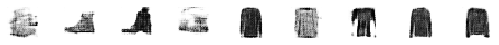

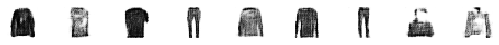

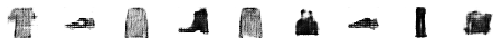

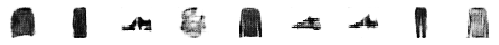

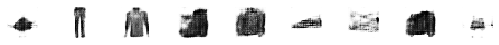

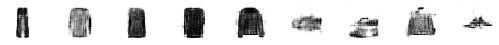

Epoch:14, Step:110, C-Loss:-0.612 G-Loss:0.021
Epoch:14, Step:120, C-Loss:-0.928 G-Loss:-0.163
Epoch:14, Step:130, C-Loss:-0.328 G-Loss:0.143
Epoch:14, Step:140, C-Loss:-0.784 G-Loss:0.048
Epoch:14, Step:150, C-Loss:-0.793 G-Loss:0.363
Epoch:14, Step:160, C-Loss:-0.112 G-Loss:0.362
Epoch:14, Step:170, C-Loss:-1.015 G-Loss:0.587
Epoch:14, Step:180, C-Loss:-0.652 G-Loss:0.429
Epoch:14, Step:190, C-Loss:-0.531 G-Loss:0.466
Epoch:14, Step:200, C-Loss:-1.106 G-Loss:0.497


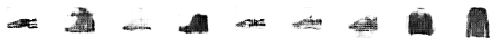

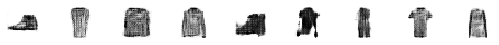

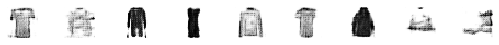

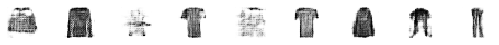

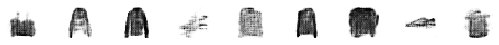

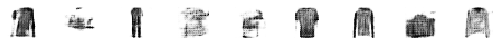

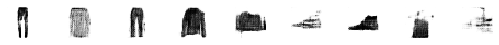

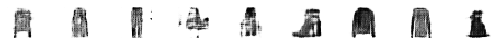

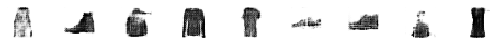

Epoch:14, Step:210, C-Loss:0.001 G-Loss:-0.078
Epoch:14, Step:220, C-Loss:-0.646 G-Loss:0.701
Epoch:14, Step:230, C-Loss:-0.709 G-Loss:0.344
Epoch:14, Step:240, C-Loss:-0.402 G-Loss:0.185
Epoch:14, Step:250, C-Loss:-0.896 G-Loss:0.037
Epoch:14, Step:260, C-Loss:-1.027 G-Loss:-0.124
Epoch:14, Step:270, C-Loss:-0.682 G-Loss:0.188
Epoch:14, Step:280, C-Loss:-0.885 G-Loss:-0.106
Epoch:14, Step:290, C-Loss:-1.195 G-Loss:-0.076
Epoch:14, Step:300, C-Loss:-0.431 G-Loss:0.129


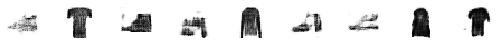

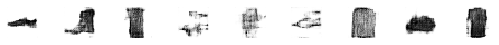

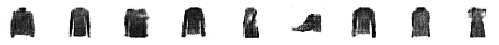

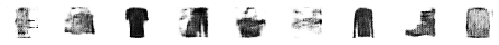

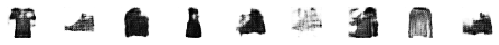

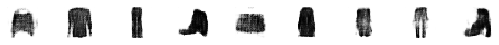

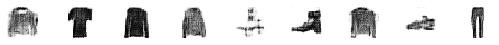

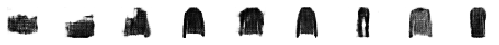

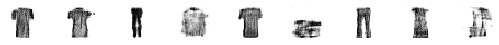

Epoch:14, Step:310, C-Loss:-0.333 G-Loss:0.428
Epoch:14, Step:320, C-Loss:-0.738 G-Loss:0.150
Epoch:14, Step:330, C-Loss:-1.088 G-Loss:-0.249
Epoch:14, Step:340, C-Loss:-1.066 G-Loss:-0.178
Epoch:14, Step:350, C-Loss:-0.428 G-Loss:0.277
Epoch:14, Step:360, C-Loss:-0.847 G-Loss:-0.065
Epoch:14, Step:370, C-Loss:-0.501 G-Loss:-0.472
Epoch:14, Step:380, C-Loss:-0.899 G-Loss:-0.361
Epoch:14, Step:390, C-Loss:-0.631 G-Loss:-0.556
Epoch:14, Step:400, C-Loss:0.029 G-Loss:-0.013


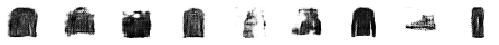

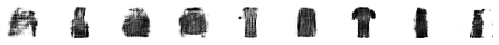

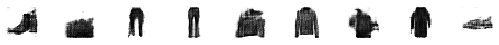

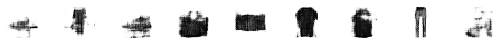

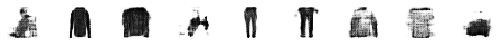

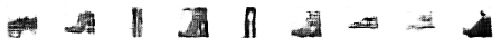

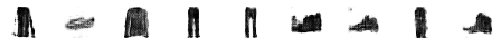

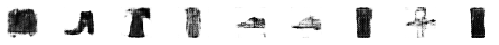

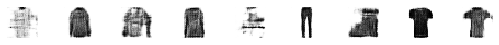

Epoch:14, Step:410, C-Loss:0.300 G-Loss:-0.154
Epoch:14, Step:420, C-Loss:-1.133 G-Loss:0.146
Epoch:14, Step:430, C-Loss:-1.786 G-Loss:-0.769
Epoch:14, Step:440, C-Loss:-0.797 G-Loss:-0.102
Epoch:14, Step:450, C-Loss:-0.747 G-Loss:0.331
Epoch:14, Step:460, C-Loss:-0.023 G-Loss:0.430
Epoch:14, Step:470, C-Loss:-0.149 G-Loss:0.061
Epoch:14, Step:480, C-Loss:-0.176 G-Loss:0.670
Epoch:14, Step:490, C-Loss:-0.352 G-Loss:0.199
Epoch:15, Step:0, C-Loss:-0.157 G-Loss:-0.061


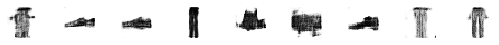

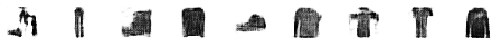

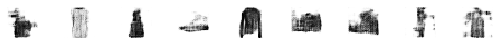

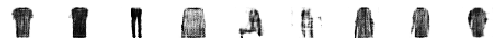

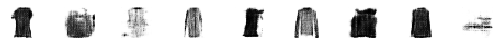

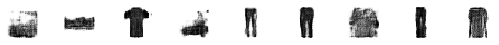

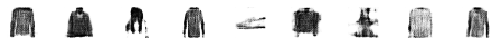

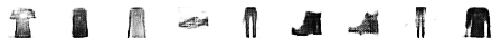

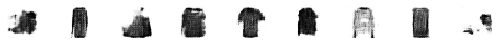

Epoch:15, Step:10, C-Loss:-1.068 G-Loss:0.327
Epoch:15, Step:20, C-Loss:0.341 G-Loss:0.379
Epoch:15, Step:30, C-Loss:-0.457 G-Loss:0.506
Epoch:15, Step:40, C-Loss:-0.716 G-Loss:-0.071
Epoch:15, Step:50, C-Loss:-0.768 G-Loss:0.203
Epoch:15, Step:60, C-Loss:-0.673 G-Loss:-0.235
Epoch:15, Step:70, C-Loss:-0.590 G-Loss:0.587
Epoch:15, Step:80, C-Loss:-0.714 G-Loss:0.845
Epoch:15, Step:90, C-Loss:-0.240 G-Loss:0.244
Epoch:15, Step:100, C-Loss:-1.760 G-Loss:0.499


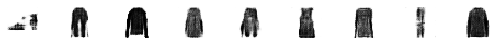

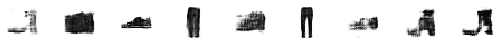

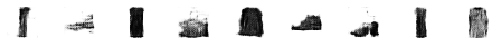

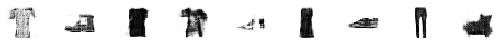

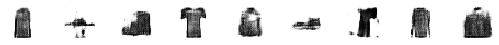

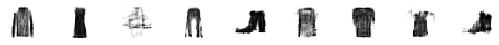

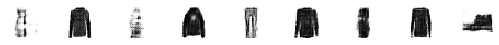

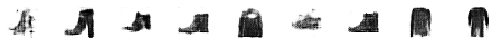

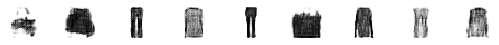

Epoch:15, Step:110, C-Loss:-0.787 G-Loss:0.393
Epoch:15, Step:120, C-Loss:0.214 G-Loss:0.595
Epoch:15, Step:130, C-Loss:-0.206 G-Loss:0.333
Epoch:15, Step:140, C-Loss:-0.232 G-Loss:0.245
Epoch:15, Step:150, C-Loss:-0.731 G-Loss:0.689
Epoch:15, Step:160, C-Loss:-0.544 G-Loss:0.180
Epoch:15, Step:170, C-Loss:-0.324 G-Loss:0.391
Epoch:15, Step:180, C-Loss:-0.987 G-Loss:-0.053
Epoch:15, Step:190, C-Loss:-0.285 G-Loss:0.338
Epoch:15, Step:200, C-Loss:-0.911 G-Loss:0.564


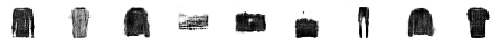

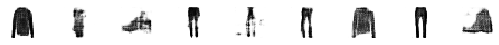

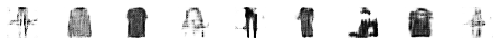

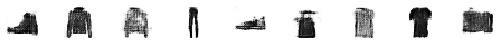

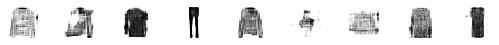

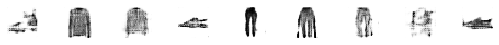

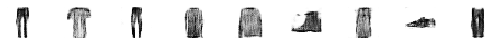

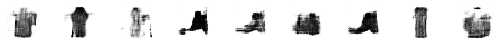

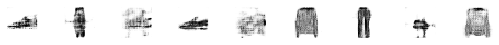

Epoch:15, Step:210, C-Loss:-0.174 G-Loss:0.033
Epoch:15, Step:220, C-Loss:-0.910 G-Loss:0.169
Epoch:15, Step:230, C-Loss:-1.369 G-Loss:0.317
Epoch:15, Step:240, C-Loss:-0.173 G-Loss:0.438
Epoch:15, Step:250, C-Loss:-0.858 G-Loss:0.253
Epoch:15, Step:260, C-Loss:-0.868 G-Loss:0.985
Epoch:15, Step:270, C-Loss:-0.508 G-Loss:-0.093
Epoch:15, Step:280, C-Loss:-0.399 G-Loss:0.033
Epoch:15, Step:290, C-Loss:-0.347 G-Loss:0.171
Epoch:15, Step:300, C-Loss:-0.567 G-Loss:0.366


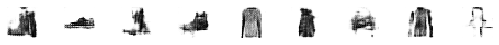

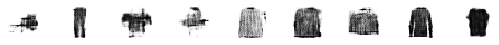

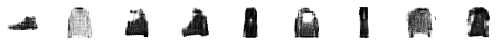

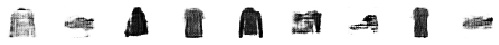

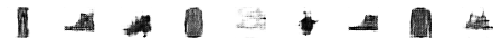

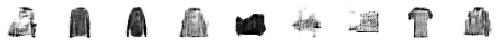

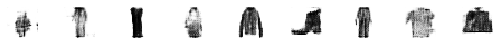

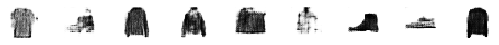

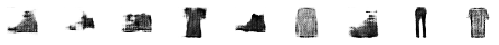

Epoch:15, Step:310, C-Loss:-0.307 G-Loss:0.367
Epoch:15, Step:320, C-Loss:-0.366 G-Loss:-0.060
Epoch:15, Step:330, C-Loss:-0.207 G-Loss:-0.771
Epoch:15, Step:340, C-Loss:-0.316 G-Loss:-0.255
Epoch:15, Step:350, C-Loss:-0.584 G-Loss:0.136
Epoch:15, Step:360, C-Loss:-0.471 G-Loss:0.051
Epoch:15, Step:370, C-Loss:0.535 G-Loss:-0.129
Epoch:15, Step:380, C-Loss:-0.711 G-Loss:-0.553
Epoch:15, Step:390, C-Loss:-1.450 G-Loss:-0.318
Epoch:15, Step:400, C-Loss:-0.143 G-Loss:-0.528


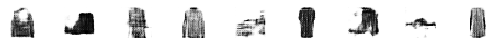

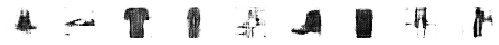

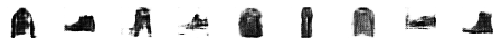

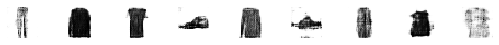

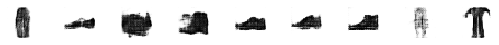

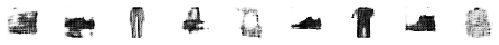

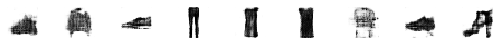

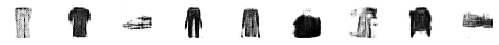

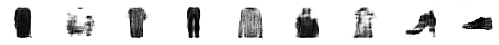

Epoch:15, Step:410, C-Loss:-0.273 G-Loss:0.255
Epoch:15, Step:420, C-Loss:-0.029 G-Loss:-0.774
Epoch:15, Step:430, C-Loss:-0.471 G-Loss:-0.099
Epoch:15, Step:440, C-Loss:-1.137 G-Loss:0.619
Epoch:15, Step:450, C-Loss:-0.573 G-Loss:-0.006
Epoch:15, Step:460, C-Loss:-0.925 G-Loss:0.414
Epoch:15, Step:470, C-Loss:-0.587 G-Loss:0.205
Epoch:15, Step:480, C-Loss:-0.177 G-Loss:0.055
Epoch:15, Step:490, C-Loss:-0.916 G-Loss:-0.300
Epoch:16, Step:0, C-Loss:-1.073 G-Loss:-0.242


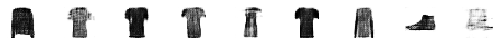

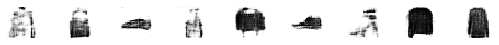

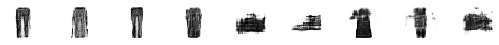

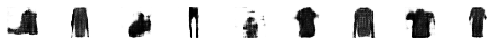

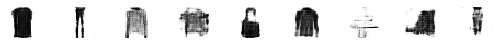

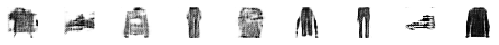

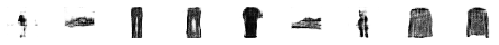

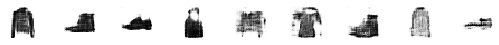

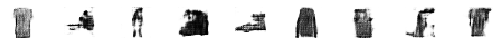

Epoch:16, Step:10, C-Loss:-0.657 G-Loss:-0.493
Epoch:16, Step:20, C-Loss:-0.713 G-Loss:-0.114
Epoch:16, Step:30, C-Loss:-0.312 G-Loss:0.017
Epoch:16, Step:40, C-Loss:-0.759 G-Loss:0.408
Epoch:16, Step:50, C-Loss:-0.125 G-Loss:0.446
Epoch:16, Step:60, C-Loss:-1.143 G-Loss:-0.376
Epoch:16, Step:70, C-Loss:-0.627 G-Loss:-0.763
Epoch:16, Step:80, C-Loss:-0.713 G-Loss:0.183
Epoch:16, Step:90, C-Loss:-1.359 G-Loss:0.066
Epoch:16, Step:100, C-Loss:-0.675 G-Loss:0.380


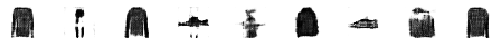

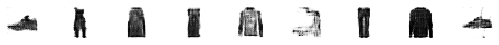

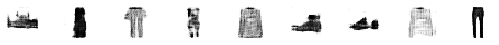

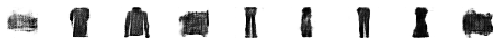

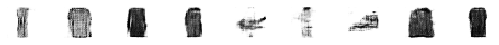

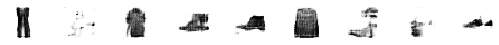

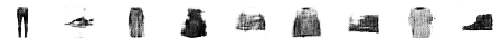

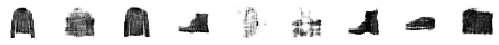

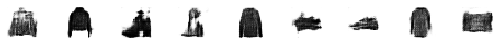

Epoch:16, Step:110, C-Loss:-0.727 G-Loss:-0.162
Epoch:16, Step:120, C-Loss:-2.009 G-Loss:0.155
Epoch:16, Step:130, C-Loss:-0.217 G-Loss:-0.764
Epoch:16, Step:140, C-Loss:-0.978 G-Loss:0.207
Epoch:16, Step:150, C-Loss:-0.804 G-Loss:-0.628
Epoch:16, Step:160, C-Loss:-0.350 G-Loss:0.256
Epoch:16, Step:170, C-Loss:-0.366 G-Loss:-0.290
Epoch:16, Step:180, C-Loss:-0.399 G-Loss:-0.313
Epoch:16, Step:190, C-Loss:0.217 G-Loss:0.659
Epoch:16, Step:200, C-Loss:-0.667 G-Loss:0.514


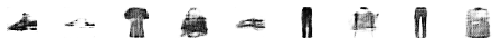

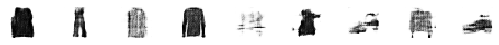

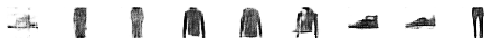

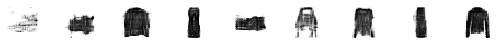

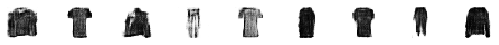

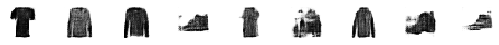

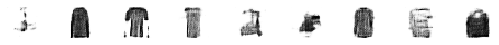

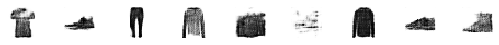

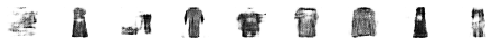

Epoch:16, Step:210, C-Loss:-0.707 G-Loss:0.383
Epoch:16, Step:220, C-Loss:-0.835 G-Loss:0.321
Epoch:16, Step:230, C-Loss:-0.488 G-Loss:0.909
Epoch:16, Step:240, C-Loss:-0.879 G-Loss:-0.273
Epoch:16, Step:250, C-Loss:-0.074 G-Loss:0.182
Epoch:16, Step:260, C-Loss:-1.073 G-Loss:-0.183
Epoch:16, Step:270, C-Loss:-0.565 G-Loss:0.235
Epoch:16, Step:280, C-Loss:-0.310 G-Loss:0.350
Epoch:16, Step:290, C-Loss:-0.430 G-Loss:-0.603
Epoch:16, Step:300, C-Loss:-0.355 G-Loss:-0.203


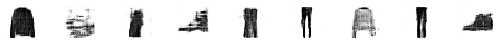

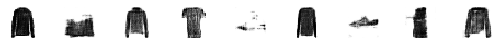

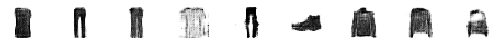

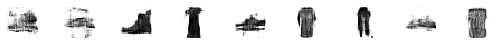

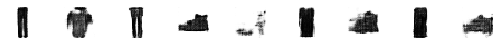

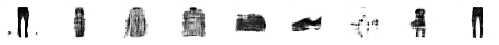

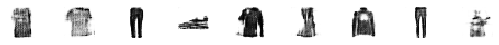

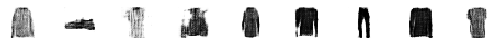

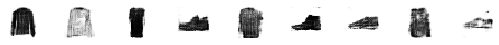

Epoch:16, Step:310, C-Loss:-0.839 G-Loss:-0.256
Epoch:16, Step:320, C-Loss:-0.640 G-Loss:-0.486
Epoch:16, Step:330, C-Loss:-0.113 G-Loss:-0.331
Epoch:16, Step:340, C-Loss:-0.424 G-Loss:-0.149
Epoch:16, Step:350, C-Loss:-1.048 G-Loss:0.361
Epoch:16, Step:360, C-Loss:-0.855 G-Loss:0.107
Epoch:16, Step:370, C-Loss:-1.171 G-Loss:-0.001
Epoch:16, Step:380, C-Loss:0.607 G-Loss:0.140
Epoch:16, Step:390, C-Loss:-0.761 G-Loss:0.126
Epoch:16, Step:400, C-Loss:0.020 G-Loss:0.162


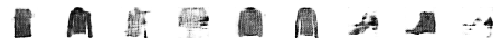

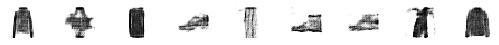

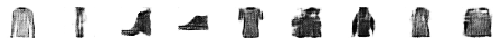

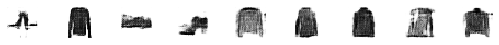

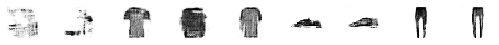

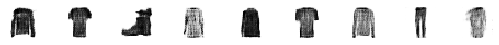

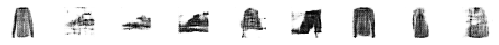

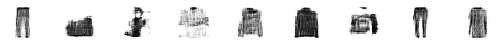

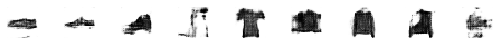

Epoch:16, Step:410, C-Loss:-1.113 G-Loss:-0.152
Epoch:16, Step:420, C-Loss:-0.272 G-Loss:-0.662
Epoch:16, Step:430, C-Loss:-1.338 G-Loss:-0.027
Epoch:16, Step:440, C-Loss:-0.387 G-Loss:-0.530
Epoch:16, Step:450, C-Loss:-0.832 G-Loss:0.057
Epoch:16, Step:460, C-Loss:-1.117 G-Loss:-0.723
Epoch:16, Step:470, C-Loss:-1.271 G-Loss:-0.114
Epoch:16, Step:480, C-Loss:-0.699 G-Loss:0.311
Epoch:16, Step:490, C-Loss:-0.614 G-Loss:1.133
Epoch:17, Step:0, C-Loss:-1.095 G-Loss:0.330


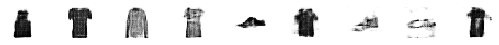

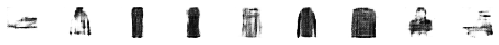

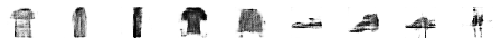

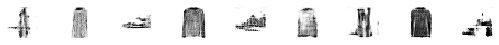

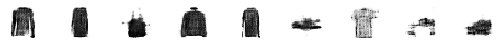

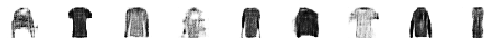

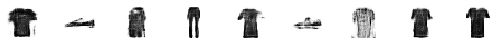

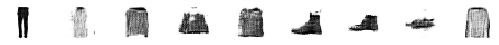

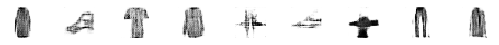

Epoch:17, Step:10, C-Loss:-0.398 G-Loss:0.408
Epoch:17, Step:20, C-Loss:-0.884 G-Loss:0.576
Epoch:17, Step:30, C-Loss:-0.485 G-Loss:0.373
Epoch:17, Step:40, C-Loss:-0.351 G-Loss:-0.317
Epoch:17, Step:50, C-Loss:-0.651 G-Loss:0.012
Epoch:17, Step:60, C-Loss:-0.760 G-Loss:0.232
Epoch:17, Step:70, C-Loss:-0.455 G-Loss:0.041
Epoch:17, Step:80, C-Loss:-0.553 G-Loss:-0.017
Epoch:17, Step:90, C-Loss:-0.567 G-Loss:0.557
Epoch:17, Step:100, C-Loss:0.184 G-Loss:-0.556


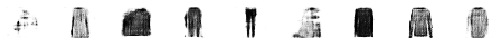

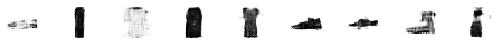

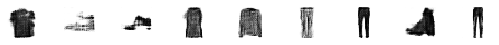

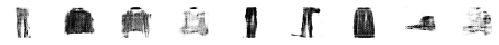

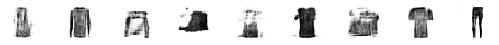

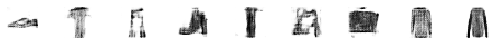

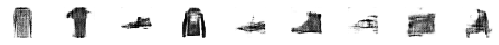

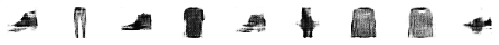

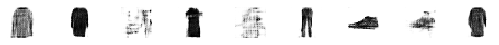

Epoch:17, Step:110, C-Loss:-0.558 G-Loss:-0.053
Epoch:17, Step:120, C-Loss:-0.681 G-Loss:-0.908
Epoch:17, Step:130, C-Loss:-0.586 G-Loss:-0.396
Epoch:17, Step:140, C-Loss:0.241 G-Loss:-0.104
Epoch:17, Step:150, C-Loss:-0.716 G-Loss:0.031
Epoch:17, Step:160, C-Loss:-0.638 G-Loss:-0.030
Epoch:17, Step:170, C-Loss:-0.957 G-Loss:-0.106
Epoch:17, Step:180, C-Loss:-0.833 G-Loss:0.558
Epoch:17, Step:190, C-Loss:-0.393 G-Loss:0.440
Epoch:17, Step:200, C-Loss:-0.210 G-Loss:0.188


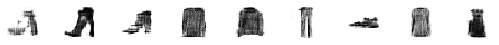

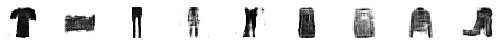

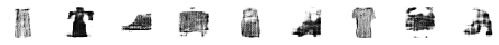

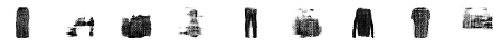

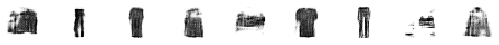

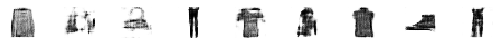

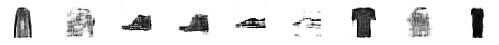

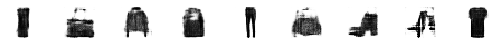

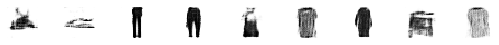

Epoch:17, Step:210, C-Loss:-0.357 G-Loss:0.369
Epoch:17, Step:220, C-Loss:-0.411 G-Loss:-0.051
Epoch:17, Step:230, C-Loss:-1.654 G-Loss:-0.115
Epoch:17, Step:240, C-Loss:-0.484 G-Loss:0.293
Epoch:17, Step:250, C-Loss:-1.240 G-Loss:0.490
Epoch:17, Step:260, C-Loss:-0.586 G-Loss:0.101
Epoch:17, Step:270, C-Loss:-0.514 G-Loss:-0.204
Epoch:17, Step:280, C-Loss:-0.326 G-Loss:0.179
Epoch:17, Step:290, C-Loss:-0.120 G-Loss:0.453
Epoch:17, Step:300, C-Loss:-0.583 G-Loss:1.001


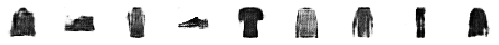

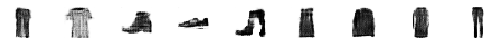

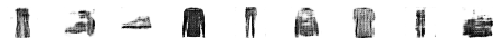

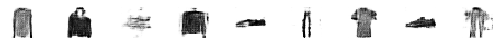

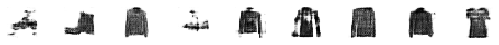

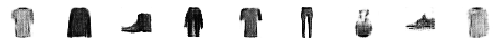

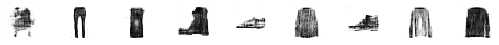

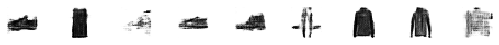

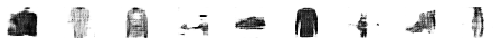

Epoch:17, Step:310, C-Loss:-0.463 G-Loss:-0.279
Epoch:17, Step:320, C-Loss:-0.431 G-Loss:0.038
Epoch:17, Step:330, C-Loss:-0.201 G-Loss:0.563
Epoch:17, Step:340, C-Loss:-0.025 G-Loss:0.319
Epoch:17, Step:350, C-Loss:-0.791 G-Loss:0.386
Epoch:17, Step:360, C-Loss:-0.635 G-Loss:-0.021
Epoch:17, Step:370, C-Loss:-0.398 G-Loss:0.113
Epoch:17, Step:380, C-Loss:-0.951 G-Loss:0.698
Epoch:17, Step:390, C-Loss:-1.009 G-Loss:0.147
Epoch:17, Step:400, C-Loss:-0.853 G-Loss:0.018


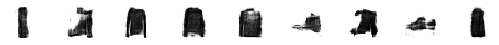

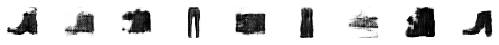

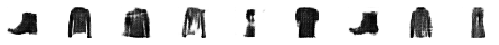

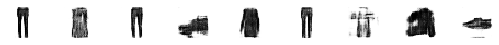

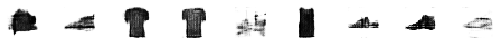

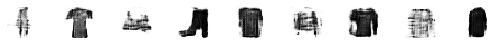

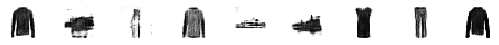

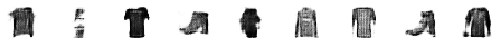

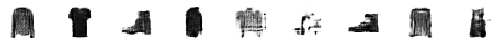

Epoch:17, Step:410, C-Loss:-0.051 G-Loss:0.421
Epoch:17, Step:420, C-Loss:-0.763 G-Loss:0.605
Epoch:17, Step:430, C-Loss:-0.024 G-Loss:0.115
Epoch:17, Step:440, C-Loss:0.055 G-Loss:0.483
Epoch:17, Step:450, C-Loss:-0.779 G-Loss:0.101
Epoch:17, Step:460, C-Loss:-0.090 G-Loss:-0.435
Epoch:17, Step:470, C-Loss:-0.817 G-Loss:0.018
Epoch:17, Step:480, C-Loss:-0.714 G-Loss:0.280
Epoch:17, Step:490, C-Loss:-0.667 G-Loss:0.231
Epoch:18, Step:0, C-Loss:0.619 G-Loss:0.498


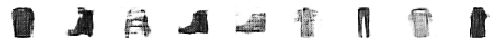

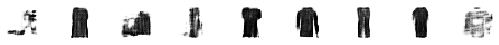

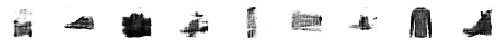

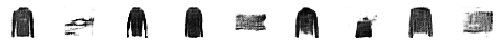

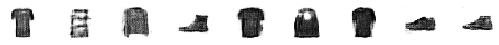

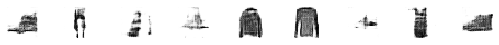

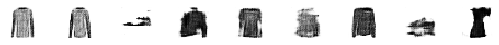

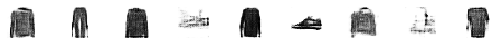

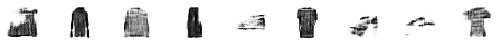

Epoch:18, Step:10, C-Loss:-0.612 G-Loss:-0.295
Epoch:18, Step:20, C-Loss:-0.157 G-Loss:0.224
Epoch:18, Step:30, C-Loss:-0.529 G-Loss:-0.289
Epoch:18, Step:40, C-Loss:-1.677 G-Loss:0.086
Epoch:18, Step:50, C-Loss:-0.582 G-Loss:-0.040
Epoch:18, Step:60, C-Loss:-0.422 G-Loss:0.695
Epoch:18, Step:70, C-Loss:-0.134 G-Loss:0.220
Epoch:18, Step:80, C-Loss:-0.715 G-Loss:0.530
Epoch:18, Step:90, C-Loss:-0.109 G-Loss:0.622
Epoch:18, Step:100, C-Loss:0.022 G-Loss:0.940


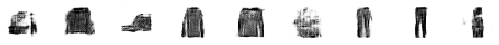

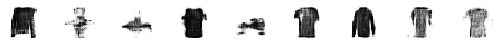

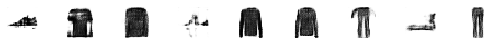

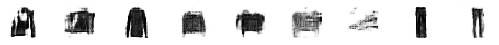

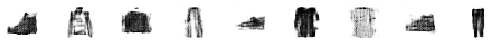

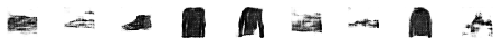

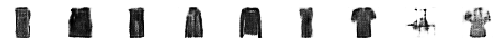

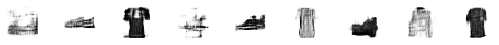

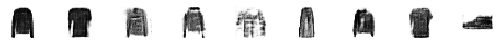

Epoch:18, Step:110, C-Loss:-1.078 G-Loss:0.162
Epoch:18, Step:120, C-Loss:-0.953 G-Loss:0.571
Epoch:18, Step:130, C-Loss:-0.350 G-Loss:0.348
Epoch:18, Step:140, C-Loss:-0.516 G-Loss:0.330
Epoch:18, Step:150, C-Loss:-0.591 G-Loss:0.083
Epoch:18, Step:160, C-Loss:-0.356 G-Loss:0.130
Epoch:18, Step:170, C-Loss:-0.697 G-Loss:0.182
Epoch:18, Step:180, C-Loss:-0.684 G-Loss:0.245
Epoch:18, Step:190, C-Loss:-1.004 G-Loss:0.454
Epoch:18, Step:200, C-Loss:-0.663 G-Loss:-0.028


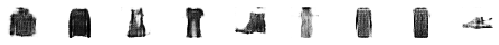

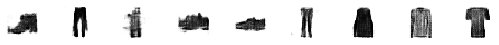

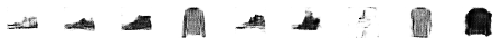

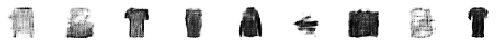

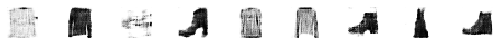

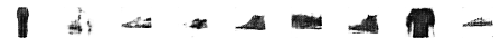

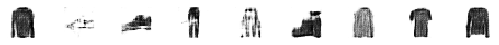

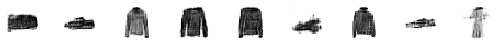

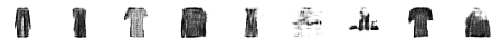

Epoch:18, Step:210, C-Loss:-0.291 G-Loss:0.334
Epoch:18, Step:220, C-Loss:-1.435 G-Loss:0.168
Epoch:18, Step:230, C-Loss:-1.049 G-Loss:-0.313
Epoch:18, Step:240, C-Loss:-0.407 G-Loss:0.006
Epoch:18, Step:250, C-Loss:-0.384 G-Loss:0.330
Epoch:18, Step:260, C-Loss:-0.517 G-Loss:-0.422
Epoch:18, Step:270, C-Loss:-0.235 G-Loss:-0.822
Epoch:18, Step:280, C-Loss:0.072 G-Loss:-0.370
Epoch:18, Step:290, C-Loss:-0.421 G-Loss:0.885
Epoch:18, Step:300, C-Loss:-0.239 G-Loss:0.499


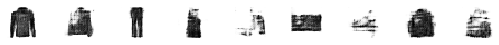

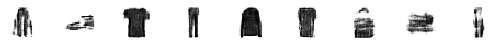

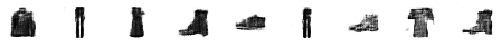

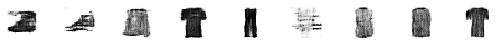

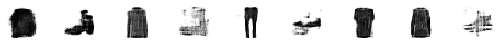

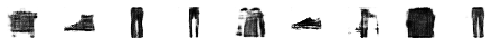

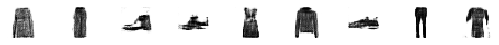

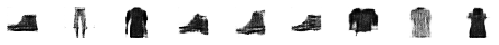

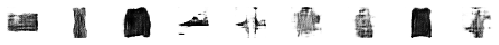

Epoch:18, Step:310, C-Loss:-1.186 G-Loss:0.494
Epoch:18, Step:320, C-Loss:-0.791 G-Loss:-0.266
Epoch:18, Step:330, C-Loss:-0.586 G-Loss:0.116
Epoch:18, Step:340, C-Loss:-0.685 G-Loss:-0.725
Epoch:18, Step:350, C-Loss:-0.568 G-Loss:-0.449
Epoch:18, Step:360, C-Loss:-0.148 G-Loss:-0.393
Epoch:18, Step:370, C-Loss:-1.209 G-Loss:0.480
Epoch:18, Step:380, C-Loss:-0.361 G-Loss:0.230
Epoch:18, Step:390, C-Loss:-0.034 G-Loss:0.409
Epoch:18, Step:400, C-Loss:0.220 G-Loss:0.039


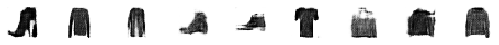

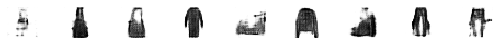

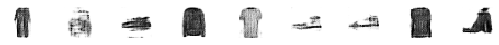

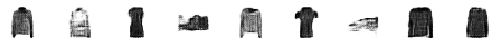

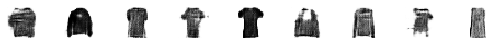

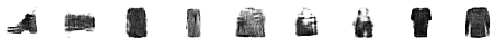

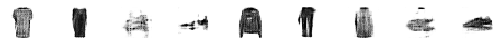

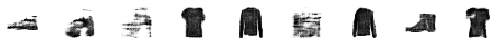

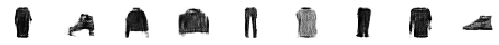

Epoch:18, Step:410, C-Loss:-0.336 G-Loss:-0.829
Epoch:18, Step:420, C-Loss:-0.715 G-Loss:-0.244
Epoch:18, Step:430, C-Loss:-0.829 G-Loss:0.011
Epoch:18, Step:440, C-Loss:-0.196 G-Loss:0.272
Epoch:18, Step:450, C-Loss:-0.534 G-Loss:-0.232
Epoch:18, Step:460, C-Loss:-0.965 G-Loss:0.570
Epoch:18, Step:470, C-Loss:-0.170 G-Loss:0.538
Epoch:18, Step:480, C-Loss:-1.694 G-Loss:0.192
Epoch:18, Step:490, C-Loss:-0.682 G-Loss:-0.021
Epoch:19, Step:0, C-Loss:-0.596 G-Loss:0.591


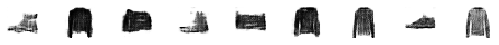

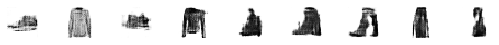

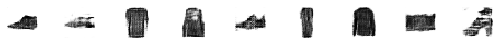

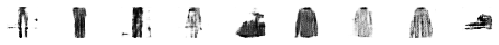

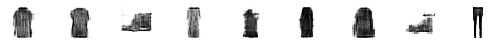

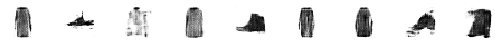

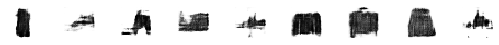

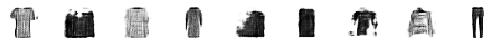

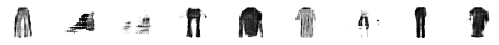

Epoch:19, Step:10, C-Loss:-0.146 G-Loss:-0.204
Epoch:19, Step:20, C-Loss:-0.979 G-Loss:-0.095
Epoch:19, Step:30, C-Loss:-0.763 G-Loss:-0.381
Epoch:19, Step:40, C-Loss:-0.750 G-Loss:0.374
Epoch:19, Step:50, C-Loss:0.060 G-Loss:-0.398
Epoch:19, Step:60, C-Loss:-0.696 G-Loss:0.031
Epoch:19, Step:70, C-Loss:-0.705 G-Loss:0.365
Epoch:19, Step:80, C-Loss:-0.587 G-Loss:0.176
Epoch:19, Step:90, C-Loss:-0.872 G-Loss:0.280
Epoch:19, Step:100, C-Loss:-0.648 G-Loss:0.258


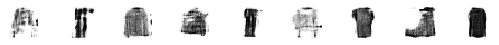

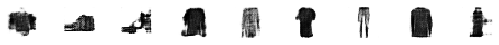

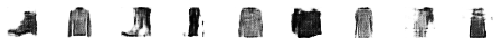

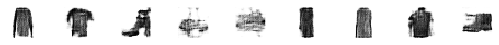

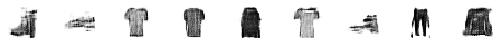

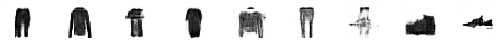

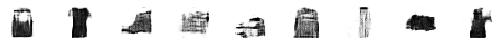

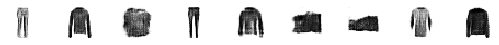

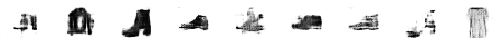

Epoch:19, Step:110, C-Loss:-0.372 G-Loss:-0.234
Epoch:19, Step:120, C-Loss:-0.740 G-Loss:-0.275
Epoch:19, Step:130, C-Loss:-0.684 G-Loss:-0.366
Epoch:19, Step:140, C-Loss:-0.242 G-Loss:-0.273
Epoch:19, Step:150, C-Loss:-0.510 G-Loss:-0.513
Epoch:19, Step:160, C-Loss:-0.252 G-Loss:0.512
Epoch:19, Step:170, C-Loss:-1.027 G-Loss:-0.111
Epoch:19, Step:180, C-Loss:0.025 G-Loss:-0.030
Epoch:19, Step:190, C-Loss:-0.242 G-Loss:0.171
Epoch:19, Step:200, C-Loss:-0.762 G-Loss:-0.486


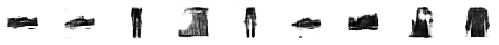

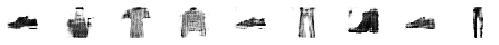

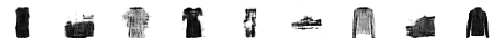

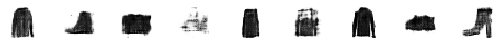

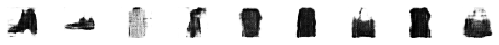

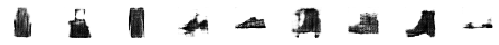

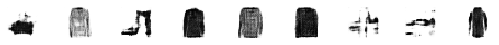

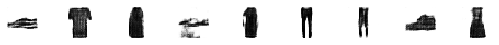

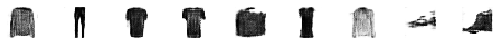

Epoch:19, Step:210, C-Loss:-0.432 G-Loss:-0.332
Epoch:19, Step:220, C-Loss:-0.086 G-Loss:-0.479
Epoch:19, Step:230, C-Loss:-0.314 G-Loss:0.748
Epoch:19, Step:240, C-Loss:-0.720 G-Loss:0.502
Epoch:19, Step:250, C-Loss:0.091 G-Loss:0.435
Epoch:19, Step:260, C-Loss:-0.389 G-Loss:-0.370
Epoch:19, Step:270, C-Loss:-0.477 G-Loss:0.053
Epoch:19, Step:280, C-Loss:-0.466 G-Loss:-0.647
Epoch:19, Step:290, C-Loss:0.149 G-Loss:-0.029
Epoch:19, Step:300, C-Loss:-0.858 G-Loss:-0.233


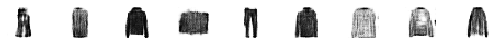

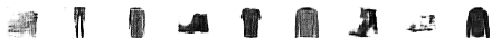

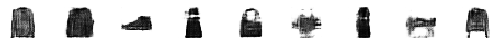

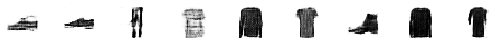

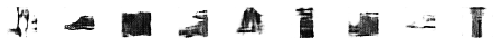

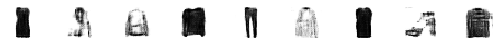

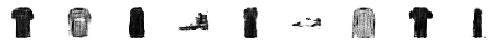

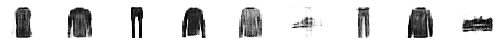

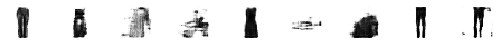

Epoch:19, Step:310, C-Loss:0.268 G-Loss:0.630
Epoch:19, Step:320, C-Loss:-0.332 G-Loss:-0.268
Epoch:19, Step:330, C-Loss:-0.193 G-Loss:0.003
Epoch:19, Step:340, C-Loss:-0.962 G-Loss:0.700
Epoch:19, Step:350, C-Loss:-0.406 G-Loss:0.405
Epoch:19, Step:360, C-Loss:-0.754 G-Loss:-0.144
Epoch:19, Step:370, C-Loss:-0.816 G-Loss:0.240
Epoch:19, Step:380, C-Loss:-0.418 G-Loss:-0.547
Epoch:19, Step:390, C-Loss:-1.772 G-Loss:0.404
Epoch:19, Step:400, C-Loss:-0.955 G-Loss:0.166


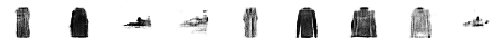

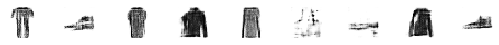

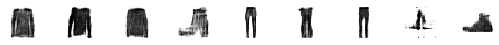

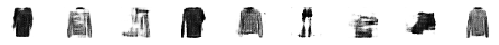

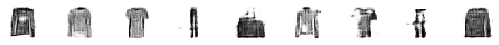

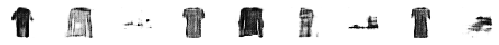

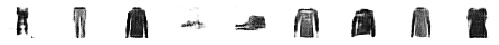

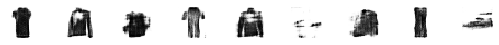

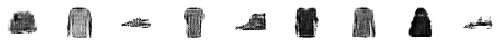

Epoch:19, Step:410, C-Loss:-0.442 G-Loss:0.118
Epoch:19, Step:420, C-Loss:-0.665 G-Loss:0.385
Epoch:19, Step:430, C-Loss:-0.299 G-Loss:0.443
Epoch:19, Step:440, C-Loss:-0.189 G-Loss:-0.543
Epoch:19, Step:450, C-Loss:-0.516 G-Loss:-1.062
Epoch:19, Step:460, C-Loss:-0.405 G-Loss:1.167
Epoch:19, Step:470, C-Loss:-0.597 G-Loss:0.165
Epoch:19, Step:480, C-Loss:-0.760 G-Loss:-0.927
Epoch:19, Step:490, C-Loss:-0.223 G-Loss:0.327
Epoch:20, Step:0, C-Loss:0.465 G-Loss:0.319


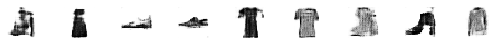

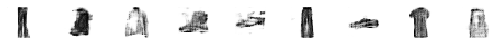

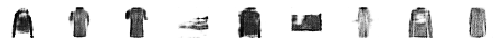

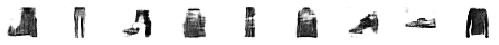

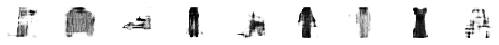

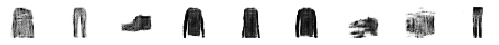

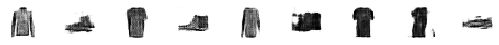

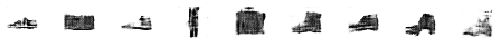

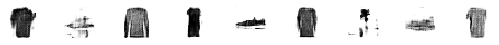

Epoch:20, Step:10, C-Loss:-0.490 G-Loss:0.030
Epoch:20, Step:20, C-Loss:-0.599 G-Loss:-0.060
Epoch:20, Step:30, C-Loss:-0.264 G-Loss:0.197
Epoch:20, Step:40, C-Loss:-1.104 G-Loss:0.135
Epoch:20, Step:50, C-Loss:-0.675 G-Loss:0.655
Epoch:20, Step:60, C-Loss:-0.011 G-Loss:0.222
Epoch:20, Step:70, C-Loss:-0.266 G-Loss:0.040
Epoch:20, Step:80, C-Loss:-0.727 G-Loss:0.101
Epoch:20, Step:90, C-Loss:-0.896 G-Loss:-0.115
Epoch:20, Step:100, C-Loss:-0.408 G-Loss:-0.223


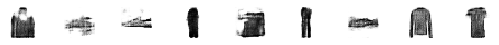

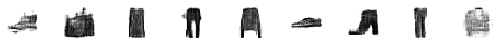

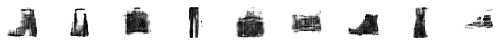

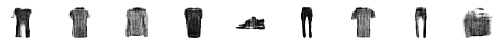

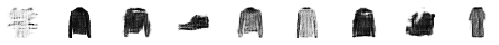

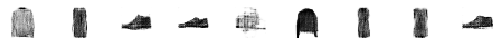

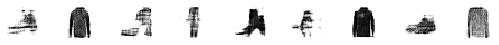

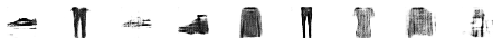

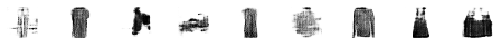

Epoch:20, Step:110, C-Loss:-0.296 G-Loss:0.381
Epoch:20, Step:120, C-Loss:-0.798 G-Loss:0.060
Epoch:20, Step:130, C-Loss:0.195 G-Loss:0.127
Epoch:20, Step:140, C-Loss:-0.450 G-Loss:0.484
Epoch:20, Step:150, C-Loss:-0.662 G-Loss:0.080
Epoch:20, Step:160, C-Loss:-1.710 G-Loss:0.242
Epoch:20, Step:170, C-Loss:-0.227 G-Loss:-0.142
Epoch:20, Step:180, C-Loss:-0.758 G-Loss:0.023
Epoch:20, Step:190, C-Loss:-0.744 G-Loss:0.320
Epoch:20, Step:200, C-Loss:-0.575 G-Loss:0.121


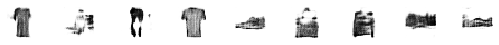

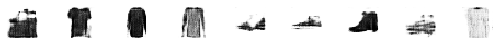

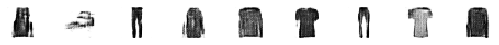

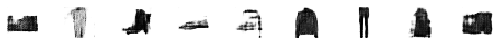

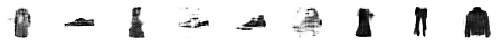

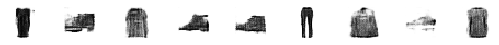

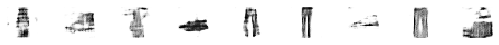

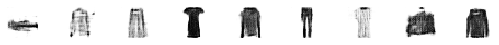

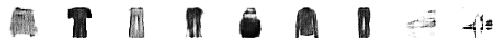

Epoch:20, Step:210, C-Loss:-0.121 G-Loss:-0.217
Epoch:20, Step:220, C-Loss:0.181 G-Loss:-0.398
Epoch:20, Step:230, C-Loss:-0.366 G-Loss:0.505
Epoch:20, Step:240, C-Loss:-0.170 G-Loss:0.059
Epoch:20, Step:250, C-Loss:-0.129 G-Loss:-0.246
Epoch:20, Step:260, C-Loss:0.045 G-Loss:0.401
Epoch:20, Step:270, C-Loss:-0.207 G-Loss:0.514
Epoch:20, Step:280, C-Loss:-0.893 G-Loss:0.319
Epoch:20, Step:290, C-Loss:-0.060 G-Loss:-0.449
Epoch:20, Step:300, C-Loss:-0.019 G-Loss:0.327


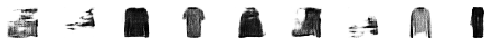

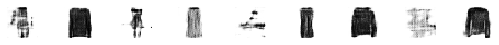

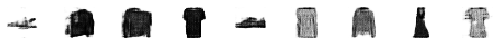

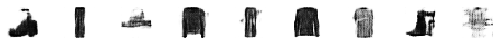

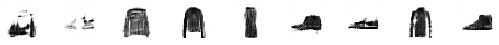

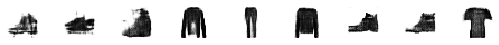

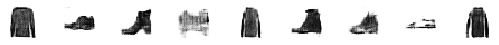

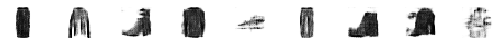

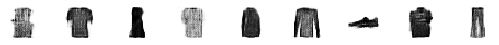

Epoch:20, Step:310, C-Loss:-0.601 G-Loss:-0.080
Epoch:20, Step:320, C-Loss:-1.579 G-Loss:-0.130
Epoch:20, Step:330, C-Loss:-0.791 G-Loss:-0.054
Epoch:20, Step:340, C-Loss:-0.194 G-Loss:0.403
Epoch:20, Step:350, C-Loss:-0.315 G-Loss:-0.153
Epoch:20, Step:360, C-Loss:-1.287 G-Loss:-0.290
Epoch:20, Step:370, C-Loss:-0.502 G-Loss:-0.018
Epoch:20, Step:380, C-Loss:-0.861 G-Loss:0.807
Epoch:20, Step:390, C-Loss:0.330 G-Loss:0.338
Epoch:20, Step:400, C-Loss:-0.530 G-Loss:-0.017


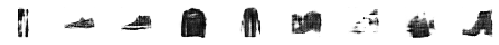

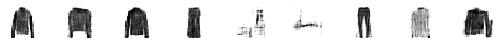

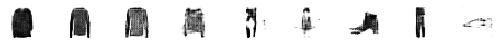

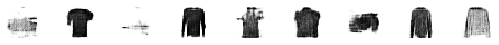

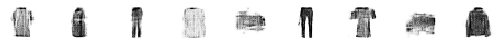

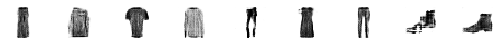

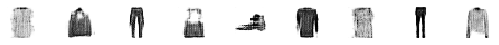

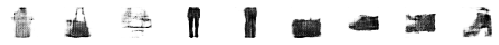

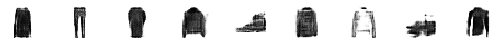

Epoch:20, Step:410, C-Loss:-0.047 G-Loss:-0.381
Epoch:20, Step:420, C-Loss:-0.628 G-Loss:-0.289
Epoch:20, Step:430, C-Loss:0.206 G-Loss:-0.224
Epoch:20, Step:440, C-Loss:0.091 G-Loss:-0.096
Epoch:20, Step:450, C-Loss:0.208 G-Loss:0.691
Epoch:20, Step:460, C-Loss:-0.685 G-Loss:0.374
Epoch:20, Step:470, C-Loss:0.029 G-Loss:0.180
Epoch:20, Step:480, C-Loss:-0.756 G-Loss:-0.037
Epoch:20, Step:490, C-Loss:-0.600 G-Loss:1.088
Epoch:21, Step:0, C-Loss:-0.594 G-Loss:-0.261


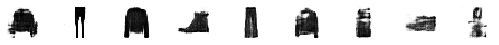

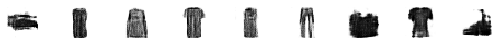

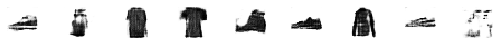

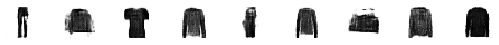

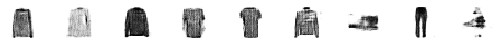

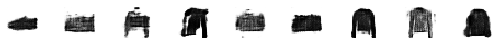

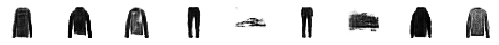

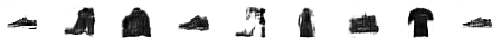

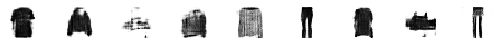

Epoch:21, Step:10, C-Loss:-0.828 G-Loss:0.655
Epoch:21, Step:20, C-Loss:-0.624 G-Loss:-0.829
Epoch:21, Step:30, C-Loss:-0.458 G-Loss:-0.335
Epoch:21, Step:40, C-Loss:-0.028 G-Loss:0.005
Epoch:21, Step:50, C-Loss:-0.512 G-Loss:-0.002
Epoch:21, Step:60, C-Loss:-0.077 G-Loss:0.452
Epoch:21, Step:70, C-Loss:0.029 G-Loss:0.194
Epoch:21, Step:80, C-Loss:-1.777 G-Loss:0.368
Epoch:21, Step:90, C-Loss:0.147 G-Loss:0.302
Epoch:21, Step:100, C-Loss:-0.762 G-Loss:0.739


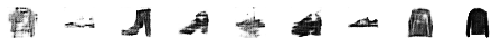

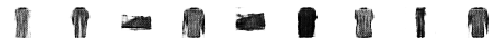

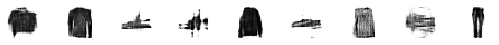

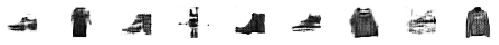

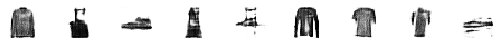

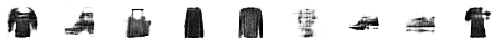

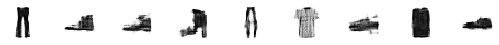

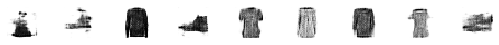

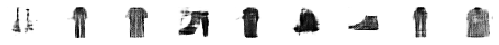

Epoch:21, Step:110, C-Loss:-0.182 G-Loss:0.029
Epoch:21, Step:120, C-Loss:-0.134 G-Loss:0.285
Epoch:21, Step:130, C-Loss:-0.068 G-Loss:-0.277
Epoch:21, Step:140, C-Loss:-0.739 G-Loss:0.513
Epoch:21, Step:150, C-Loss:-0.268 G-Loss:0.069
Epoch:21, Step:160, C-Loss:-0.155 G-Loss:0.058
Epoch:21, Step:170, C-Loss:-0.735 G-Loss:0.573
Epoch:21, Step:180, C-Loss:-0.139 G-Loss:0.333
Epoch:21, Step:190, C-Loss:-0.656 G-Loss:0.217
Epoch:21, Step:200, C-Loss:-0.822 G-Loss:-0.078


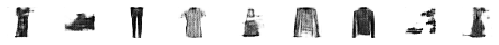

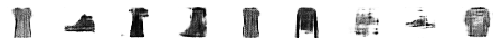

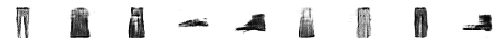

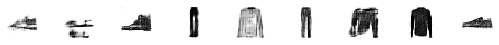

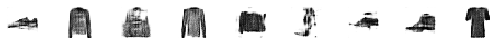

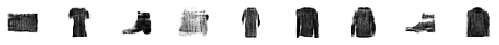

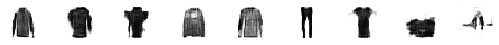

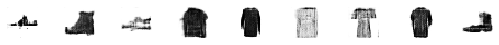

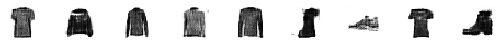

Epoch:21, Step:210, C-Loss:-0.802 G-Loss:-0.436
Epoch:21, Step:220, C-Loss:-0.698 G-Loss:0.291
Epoch:21, Step:230, C-Loss:-0.953 G-Loss:-0.301
Epoch:21, Step:240, C-Loss:-0.995 G-Loss:-0.078
Epoch:21, Step:250, C-Loss:0.153 G-Loss:0.348
Epoch:21, Step:260, C-Loss:-0.548 G-Loss:0.318
Epoch:21, Step:270, C-Loss:-0.333 G-Loss:-0.093
Epoch:21, Step:280, C-Loss:0.032 G-Loss:0.237
Epoch:21, Step:290, C-Loss:-0.472 G-Loss:-0.265
Epoch:21, Step:300, C-Loss:-0.452 G-Loss:-0.494


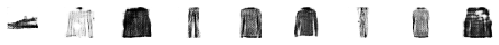

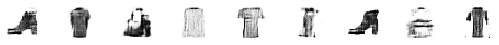

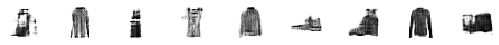

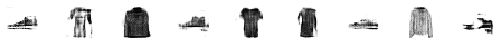

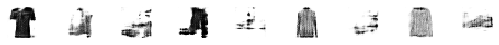

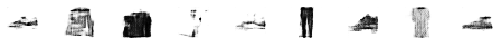

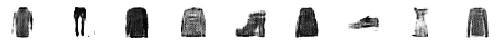

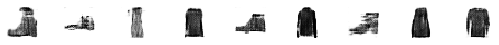

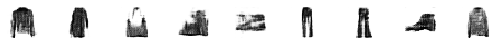

Epoch:21, Step:310, C-Loss:-1.034 G-Loss:-0.548
Epoch:21, Step:320, C-Loss:-1.262 G-Loss:0.112
Epoch:21, Step:330, C-Loss:-0.293 G-Loss:0.339
Epoch:21, Step:340, C-Loss:-0.445 G-Loss:-0.471
Epoch:21, Step:350, C-Loss:0.238 G-Loss:-0.128
Epoch:21, Step:360, C-Loss:0.275 G-Loss:0.250
Epoch:21, Step:370, C-Loss:-0.758 G-Loss:-0.007
Epoch:21, Step:380, C-Loss:-0.669 G-Loss:-0.162
Epoch:21, Step:390, C-Loss:-0.725 G-Loss:0.354
Epoch:21, Step:400, C-Loss:-0.545 G-Loss:0.071


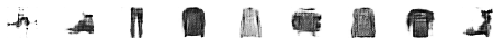

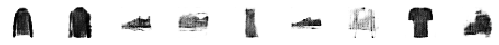

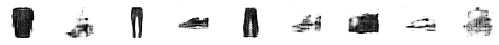

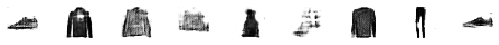

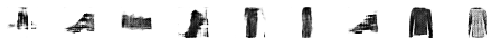

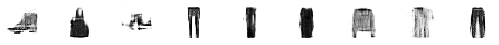

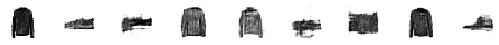

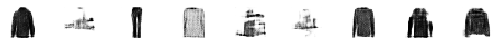

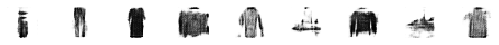

Epoch:21, Step:410, C-Loss:-0.284 G-Loss:-0.239
Epoch:21, Step:420, C-Loss:-1.109 G-Loss:-0.421
Epoch:21, Step:430, C-Loss:-0.364 G-Loss:-0.039
Epoch:21, Step:440, C-Loss:-1.309 G-Loss:-0.396
Epoch:21, Step:450, C-Loss:-0.606 G-Loss:0.307
Epoch:21, Step:460, C-Loss:-0.232 G-Loss:-0.249
Epoch:21, Step:470, C-Loss:-0.829 G-Loss:0.470
Epoch:21, Step:480, C-Loss:-0.422 G-Loss:0.464
Epoch:21, Step:490, C-Loss:-0.419 G-Loss:-0.019
Epoch:22, Step:0, C-Loss:-0.964 G-Loss:0.431


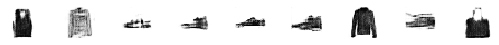

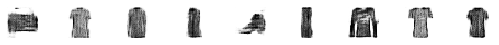

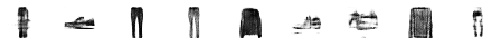

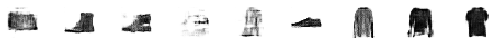

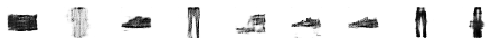

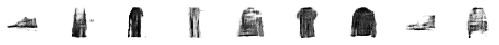

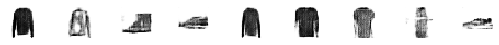

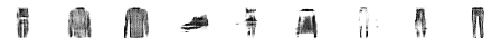

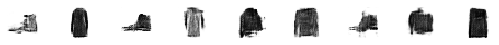

Epoch:22, Step:10, C-Loss:-0.603 G-Loss:0.154
Epoch:22, Step:20, C-Loss:-0.665 G-Loss:1.014
Epoch:22, Step:30, C-Loss:-1.203 G-Loss:0.486
Epoch:22, Step:40, C-Loss:-1.299 G-Loss:0.892
Epoch:22, Step:50, C-Loss:-0.415 G-Loss:0.144
Epoch:22, Step:60, C-Loss:-0.919 G-Loss:0.655
Epoch:22, Step:70, C-Loss:-0.941 G-Loss:1.115
Epoch:22, Step:80, C-Loss:-0.495 G-Loss:0.513
Epoch:22, Step:90, C-Loss:-0.360 G-Loss:1.021
Epoch:22, Step:100, C-Loss:-0.274 G-Loss:0.567


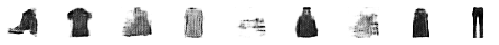

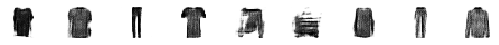

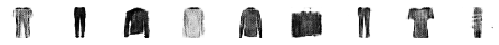

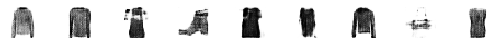

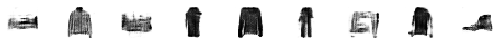

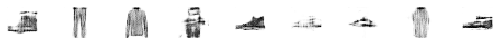

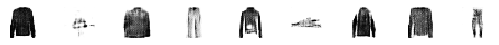

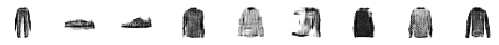

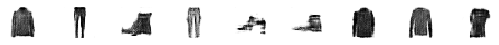

Epoch:22, Step:110, C-Loss:-0.613 G-Loss:-0.182
Epoch:22, Step:120, C-Loss:-1.030 G-Loss:-0.201
Epoch:22, Step:130, C-Loss:-0.203 G-Loss:0.552
Epoch:22, Step:140, C-Loss:-1.111 G-Loss:0.107
Epoch:22, Step:150, C-Loss:-0.917 G-Loss:0.017
Epoch:22, Step:160, C-Loss:-0.964 G-Loss:0.498
Epoch:22, Step:170, C-Loss:-0.558 G-Loss:-0.111
Epoch:22, Step:180, C-Loss:-0.983 G-Loss:0.530
Epoch:22, Step:190, C-Loss:-0.116 G-Loss:-0.365
Epoch:22, Step:200, C-Loss:0.358 G-Loss:-0.217


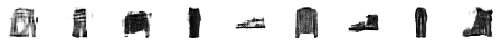

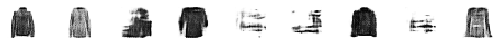

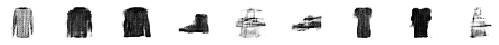

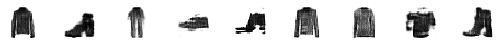

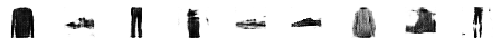

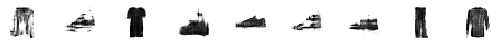

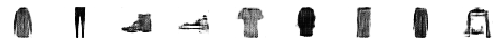

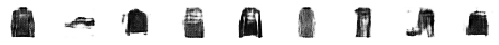

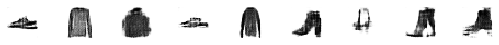

Epoch:22, Step:210, C-Loss:-1.290 G-Loss:0.023
Epoch:22, Step:220, C-Loss:0.140 G-Loss:0.028
Epoch:22, Step:230, C-Loss:-0.137 G-Loss:0.215


KeyboardInterrupt: 

In [16]:
epochs = 500
batch_size = 32
steps = 500
noise_size = 100

for i in range(0, epochs):
    for j in range(steps):
        # With Number of Critics=5
        for _ in range(5):
            random_noise_batch = get_random_noise(batch_size, noise_size)
            real_samples = get_real_samples(batch_size=batch_size)

            fake_y = np.ones((batch_size, 1))
            real_y = -np.ones((batch_size, 1))
            dummy = np.zeros((batch_size, 1))

            # Updating Critic weights            
            loss_c = critic_model.train_on_batch([real_samples,random_noise_batch], [real_y, fake_y, dummy])
        
        noise_batch = get_random_noise(batch_size, noise_size)
        wgan_input = noise_batch
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        wgan_output = -np.ones((batch_size, 1))
        
        # Updating Generator weights
        loss_g = wgan_gp_model.train_on_batch(wgan_input, wgan_output)
        
        if j%10 == 0:
            print ("Epoch:%.0f, Step:%.0f, C-Loss:%.3f G-Loss:%.3f"%(i,j,loss_c[0],loss_g))
            if j%100==0:
                show_generator_results(generator_network)